# IMDB MOVIE NETWORK ANALYSIS
# EXPLAINER NOTEBOOK

## Part 1: Motivation

#### From idea to execution

A successful movie entertains audience, and enables film companies to gain great profit. A lot of factors such as good directors and experienced actors are considerable for creating good movies. However, famous directors and actors cannot guarantee a highly rated imdb score. Thus this study wishes to investigate some of these relationships in the movie industry to understand what makes a movie successfull. 

The first idea was to make an analysis of the actors and their collaborations based on the shared movies. This should have provided insight in the movie industry based on big players, profits, genders and so on. However, the chosen dataset is based on movies, and it has then been decided that the analysis should be based on a network of movies and related analyses of reviews.

The overall idea is therefore: *"What makes a movie successfull?"* In this regard successfull is based on good imdb-score and reviews. The study aims at showing the results of the analysis in an intuitive way by visualizing networks, text analyses and outcomes. 

To make this happen, a network analysis has been made; the main analysis of the movie network with shared actors as links. Furthermore, a text analysis has been made to investigate the reviews of the movies to get the watchers' perspective on what make a movie successfull based on different point of views (rankings, communities and genres).

#### The dataset
The data for this project is original IMDb-data extracted from kaggle.com (https://www.kaggle.com/carolzhangdc/imdb-5000-movie-dataset). The data is build around the movies where each line represent a movie. There are 28 columns in total: 

In [1]:
import pandas as pd

In [2]:
data = pd.read_csv("movie_metadata.csv", sep = ',')
list(data.columns)

['color',
 'director_name',
 'num_critic_for_reviews',
 'duration',
 'director_facebook_likes',
 'actor_3_facebook_likes',
 'actor_2_name',
 'actor_1_facebook_likes',
 'gross',
 'genres',
 'actor_1_name',
 'movie_title',
 'num_voted_users',
 'cast_total_facebook_likes',
 'actor_3_name',
 'facenumber_in_poster',
 'plot_keywords',
 'movie_imdb_link',
 'num_user_for_reviews',
 'language',
 'country',
 'content_rating',
 'budget',
 'title_year',
 'actor_2_facebook_likes',
 'imdb_score',
 'aspect_ratio',
 'movie_facebook_likes']

The data contains a lot of data about the movie (title, director, actors, duration, genres, language etc.) and a bunch of data concerning the popularity of the movie (facebook likes, gross, number of voted users, content rating, imdb score etc.). The dataset is reduced to only investigate movies from 2010 and after. This reduction of the latest 10 years seems fair when trying to analyse what makes movies successfull *today*. 


To work with this data in a social matter, this project investigates how the movies are connected by actors.
Besides the above dataframe, the package IMDbPY is used to retrieve reviews of the movies to do the text analysis showing the meanings and experiences of the watchers.


#### Why this dataset? 
This dataset is rich since it contains a lot of movies and has lots of information about each of the movies. The dataset contains 28 variables for 5043 movies, spanning across 100 years in 66 countries. There are 2399 unique director names, and thousands of actors/actresses. Even though the dataset is reduced for these analyses, all the variables make it rich enough to hopefully gain deep insights. 

IMDbPY is used to scrape the IMDb-webpage for the reviews of the movies based on the movie IDs. This package provides many reviews for each movie which allows us to to really play around in the text analyses.  


#### The product for the end user
The results from this study can hopefully help movie companies, actors, directors, investers, watchers and other interested to understand the secret of generating a successful movie. The results will be presented in a more intuitive and interactive way at the website.

#### Structure of this notebook
The notebook mainly consists of three parts; "Basic Stats", "Tools, theory and analysis" and "Discussion".

The Basic Stats aims to get an understanding of the movie dataset by using explorative statistics. This section should provide ideas for what to investigate further. Furthermore, this section includes data cleaning and preparation.

The Tools, theory and analysis part contains two main parts; Network Analysis and Text Analysis. Each of these are divided into further sub-analyses. In the beginning of each sub-analysis a short presentation of theory and purpose is made. The tools are explained and applied parallely, as both theoratical descriptions around the code blocks and practical descriptions inside the code blocks. At the end of each sub-analysis, the outcome is comment on.

The Discussion will both discuss main results, data quality and further work.

## Part 2: Basic stats

This section strives to look at the movie dataset and prepping it for the later analyses as well as basic stats are conducted about the dataset to get an overall understanding. 

### Data cleaning and preparation

This section will prepare the movie dataset to be ready for the upcoming analyses. This includes removing missing data, transforming some columns, dropping duplicated movie titles and selecting movies from after 2010.

In [3]:
import numpy as np
import re 
import nltk
import networkx as nx
from fa2 import ForceAtlas2
import matplotlib.pyplot as plt
import community
import random
from imdb import IMDb
from sklearn.preprocessing import MultiLabelBinarizer
import seaborn as sns
from collections import Counter, OrderedDict
import json
from random import sample 
from wordcloud import WordCloud
from nltk.collocations import BigramCollocationFinder 
from nltk.metrics import BigramAssocMeasures

In [4]:
import warnings
warnings.filterwarnings('ignore')

In [5]:
pd.set_option('display.max_columns', 50)

In [6]:
# Dropping the movies if they have null values in some of the columns
data = pd.read_csv("movie_metadata.csv", sep = ',')
data = data.dropna()

First the movies titels are transformed to be on the right form 

In [7]:
# Adjusting the titles: removing wierd characters, numbers and punctuation and replacing the spaces with underscores.
m = list(data['movie_title'])

titles = [re.sub('\xa0', '', t).strip() for t in m]
titles = [re.sub(' ', '_', t) for t in titles]
titles = [re.sub(':', '', t) for t in titles]
titles = [re.sub(',', '', t) for t in titles]
titles = [re.sub('\.', '', t) for t in titles]
titles = [re.sub('\'', '', t) for t in titles]
titles = [re.sub('-', '', t) for t in titles]

A sample of the data is selected. Furthermore, movies occuring more than once are removed and only the movies after 2010 is selected in the reduced dataset. 

In [8]:
# Adding the adjusted titles as a new column and dropping duplicates
data['Title'] = titles
data = data.drop_duplicates(subset = 'Title')

In [9]:
# Reducing the dataset by only looking at movies from the last 10 years from today
data = data[data['title_year'] >= 2010]
data = data.reset_index(drop=True)

In [10]:
print('Movies in reduced dataset:', len(data))

Movies in reduced dataset: 946


The actors' names are transformed to the right format and a list of all unique actors and movies are created. 

In [11]:
# Replacing spaces with underscore in the actorname columns
for i in range(len(data)):
    data['actor_1_name'][i] = data['actor_1_name'][i].replace(' ', '_') 
    data['actor_2_name'][i] = data['actor_2_name'][i].replace(' ', '_') 
    data['actor_3_name'][i] = data['actor_3_name'][i].replace(' ', '_') 

In [12]:
# Making an unique list of actors occuring in the dataset
actor_list = pd.unique(data[['actor_1_name', 'actor_2_name', 'actor_3_name']].values.ravel('K'))

In [13]:
# Making an unique list of movies occuring in the dataset
movie_list = set(data['Title'])

The genres for the movies is divided by the '|' seperator in one column. Thus the code below will split each genre into their own binary column and merge them on a copy of the full dataset, where the value of the fields will be 1 if the movie are categorised as the given genre, and 0 otherwise. Be aware that the movies often have more genres assigned.

In [14]:
data["genres"]=data.genres.str.split('|')
mlb = MultiLabelBinarizer()

s=data['genres']
new=pd.DataFrame(mlb.fit_transform(s),columns=mlb.classes_, index=data.index)
dataset = pd.concat([data, new], axis=1, sort=False)
dataset=dataset.drop(['genres'],axis=1)
dataset.head()

,color,director_name,num_critic_for_reviews,duration,director_facebook_likes,actor_3_facebook_likes,actor_2_name,actor_1_facebook_likes,gross,actor_1_name,movie_title,num_voted_users,cast_total_facebook_likes,actor_3_name,facenumber_in_poster,plot_keywords,movie_imdb_link,num_user_for_reviews,language,country,content_rating,budget,title_year,actor_2_facebook_likes,imdb_score,aspect_ratio,movie_facebook_likes,Title,Action,Adventure,Animation,Biography,Comedy,Crime,Documentary,Drama,Family,Fantasy,History,Horror,Music,Musical,Mystery,Romance,Sci-Fi,Sport,Thriller,War,Western
0,Color,Sam Mendes,602.0,148.0,0.0,161.0,Rory_Kinnear,11000.0,200074175.0,Christoph_Waltz,Spectre,275868,11700,Stephanie_Sigman,1.0,bomb|espionage|sequel|spy|terrorist,http://www.imdb.com/title/tt2379713/?ref_=fn_t...,994.0,English,UK,PG-13,245000000.0,2015.0,393.0,6.8,2.35,85000,Spectre,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
1,Color,Christopher Nolan,813.0,164.0,22000.0,23000.0,Christian_Bale,27000.0,448130642.0,Tom_Hardy,The Dark Knight Rises,1144337,106759,Joseph_Gordon-Levitt,0.0,deception|imprisonment|lawlessness|police offi...,http://www.imdb.com/title/tt1345836/?ref_=fn_t...,2701.0,English,USA,PG-13,250000000.0,2012.0,23000.0,8.5,2.35,164000,The_Dark_Knight_Rises,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
2,Color,Andrew Stanton,462.0,132.0,475.0,530.0,Samantha_Morton,640.0,73058679.0,Daryl_Sabara,John Carter,212204,1873,Polly_Walker,1.0,alien|american civil war|male nipple|mars|prin...,http://www.imdb.com/title/tt0401729/?ref_=fn_t...,738.0,English,USA,PG-13,263700000.0,2012.0,632.0,6.6,2.35,24000,John_Carter,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
3,Color,Nathan Greno,324.0,100.0,15.0,284.0,Donna_Murphy,799.0,200807262.0,Brad_Garrett,Tangled,294810,2036,M.C._Gainey,1.0,17th century|based on fairy tale|disney|flower...,http://www.imdb.com/title/tt0398286/?ref_=fn_t...,387.0,English,USA,PG,260000000.0,2010.0,553.0,7.8,1.85,29000,Tangled,0,1,1,0,1,0,0,0,1,1,0,0,0,1,0,1,0,0,0,0,0
4,Color,Joss Whedon,635.0,141.0,0.0,19000.0,Robert_Downey_Jr.,26000.0,458991599.0,Chris_Hemsworth,Avengers: Age of Ultron,462669,92000,Scarlett_Johansson,4.0,artificial intelligence|based on comic book|ca...,http://www.imdb.com/title/tt2395427/?ref_=fn_t...,1117.0,English,USA,PG-13,250000000.0,2015.0,21000.0,7.5,2.35,118000,Avengers_Age_of_Ultron,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0


In [15]:
# Saving the dataset
dataset.to_csv("dataset.csv", sep=',',index=False)

The movie dataset which is the main data, is now cleaned and ready for analyses. 

### Basic statistic

In the following, the data is investigated to understand correlations and patterns. Hopefully it will gain insight to what can be analysed further. 

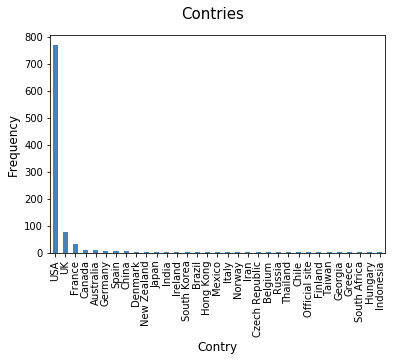

In [16]:
contries=dataset.groupby('country').size().sort_values(ascending=False)
contries.plot('bar', color = 'steelblue')
plt.suptitle('Contries', fontsize=15)
plt.xlabel('Contry', fontsize=12)
plt.ylabel('Frequency', fontsize=12)
plt.savefig('countries_bar.png')
plt.show()

The histogram above shows that movies from USA clearly constitues the majority of the contries. UK is the second most common contry in the movie production but represents less than one-seventh of USAs part.

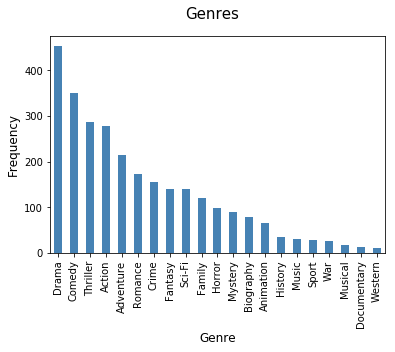

In [17]:
genres=new.sum().sort_values(ascending=False)
genres.plot('bar', color = 'steelblue')
plt.suptitle('Genres', fontsize=15)
plt.xlabel('Genre', fontsize=12)
plt.ylabel('Frequency', fontsize=12)
plt.savefig('genres_bar.png')
plt.show()

The genre plot above shows that Drama clearly is the most used genre for the movies. The historgram of the different genres are steadily decling popularity for each of them. Again, the total frequency will be much higher than the number of movies since each movie often have several genres assigned.

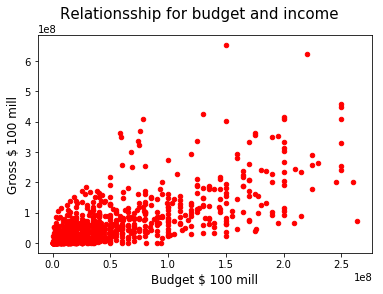

In [18]:
dataset.plot(kind='scatter',x='budget',y='gross',color='red')
plt.suptitle('Relationsship for budget and income', fontsize=15)
plt.xlabel('Budget $ 100 mill', fontsize=12)
plt.ylabel('Gross $ 100 mill', fontsize=12)
plt.savefig('budget_income.png')
plt.show()

This scatter plot shows the connection between a movies budget and it gross income. The plot shows some link between higher budgets result in higher income. The connection is however not linear, as the gross income does not 'grow' as fast compared to the budget. 

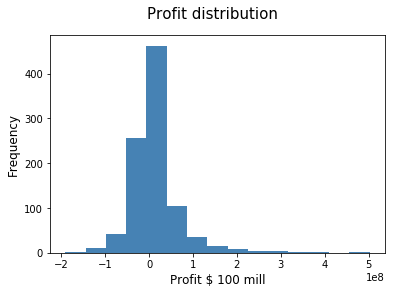

The average profit in $: 13401325.994714588
The median profit in $: 2271097.0


In [19]:
dataset['Profit']=dataset['gross']-dataset['budget']
dataset['Profit'].plot('hist',bins=15, color = 'steelblue')
plt.suptitle('Profit distribution', fontsize=15)
plt.xlabel('Profit $ 100 mill', fontsize=12)
plt.ylabel('Frequency', fontsize=12)
plt.savefig('profit.png')
plt.show()
print('The average profit in $:', np.mean(dataset['Profit']))
print('The median profit in $:', np.median(dataset['Profit']))

Surprisingly the profit distribution shows that a big amount of the movies has a profit lower than 0. The majority of movies looks like the have a profit around 0 and 0.5 billion dollars. Although the histogram seems as there are many negative profits both the average and median is both clearly greater than 0. 

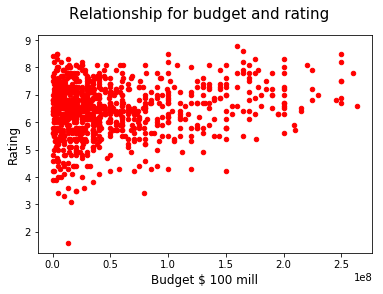

In [20]:
profitable=dataset[['Title','imdb_score','budget']]
profitable=profitable.sort_values(by=['imdb_score'],ascending=False)
profitable.plot(kind='scatter',x='budget',y='imdb_score',color='red')
plt.suptitle('Relationship for budget and rating', fontsize=15)
plt.xlabel('Budget $ 100 mill', fontsize=12)
plt.ylabel('Rating', fontsize=12)
plt.savefig('budget_rating.png')
plt.show() 

From this scatter plot it is clear that a higher budget does not necessarily lead to higher rating (just as we saw it did not lead to higher income). There is a small tendency that the higher budgets will avoid getting the lowest scores, but the highest score will appear for both low and high budget movies. 

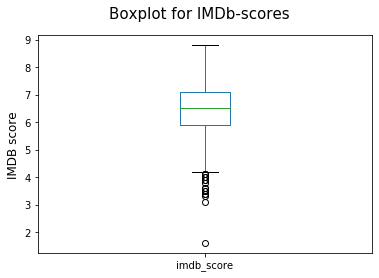

33 Percentile: 6.1
66 Percentile: 6.9
25 Percentile: 5.9
50 Percentile: 6.5
75 Percentile: 7.1


In [21]:
dataset['imdb_score'].plot('box')
plt.suptitle('Boxplot for IMDb-scores', fontsize=15)
plt.ylabel('IMDB score', fontsize=12)
plt.savefig('ratings.png')
plt.show()
print('33 Percentile:',np.percentile(dataset['imdb_score'],33))
print('66 Percentile:', np.percentile(dataset['imdb_score'],66))
print('25 Percentile:',np.percentile(dataset['imdb_score'],25))
print('50 Percentile:',np.percentile(dataset['imdb_score'],50))
print('75 Percentile:',np.percentile(dataset['imdb_score'],75))

The boxplot for the ratings shows an average around 6.5. The 25 percentile is at 5.9 while the 75 percentile is at 7.1. It is interesting how high the ratings are on average, which indicates that the full scale are not used as supposed to.

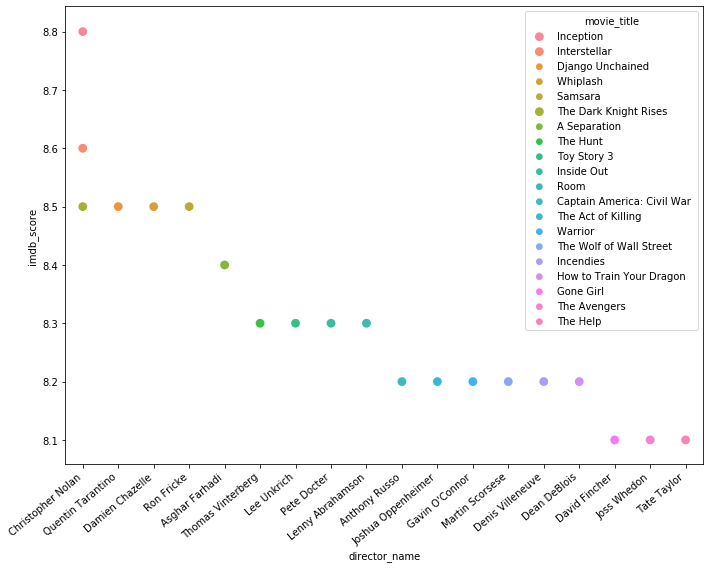

In [22]:
#Top 20 directors of movies based on the imdb rating of the movies. 
plt.figure(figsize=(10,8))

movie_df= data.sort_values(by ='imdb_score' , ascending=False)
movie_df_new=movie_df.head(20)
ax=sns.pointplot(movie_df_new['director_name'], movie_df_new['imdb_score'], hue=movie_df_new['movie_title'])
ax.set_xticklabels(ax.get_xticklabels(), rotation=40, ha="right")
plt.tight_layout()
plt.show()

This plot shows who is the main directors when looking at movies with high imdb score. It is interesting to see for Christopher Nolan, that his top three movies scores the same or better than the other top directors movies.  

This part of exploring the movie dataset shows mulitple tendencies which could be interesting to investigate. The following tendencies will be incorporated as understanding parameters in the following analyses.

## Part 3: Tools, theory and analysis

This section contains all the analyses divided into the main topics Network analysis and Text analysis. Each of these topics have further sub-analyses to enlighten the topics from several perspectives. 

### Network Analysis - Movies
The purpose of this network analysis is to investigate how the movies are connected based on their use of actors. It interesting to see the choices of actors regarding how the movies are connected. 

#### Network description

The network of the movies consists of all the movies (from the samlpe) as the nodes and the edges between the movies represent whether two movies share any of their actors. The edges between two movies are undirected and can have a weight between 1 and 3, representing how many of their top 3 actors the two movies share. It is here assumed that the big/popular nodes will be the movies that have many shared actors with other movies. These shared actors which occur often will thus be popular and it is therefore assumed that also the movies with lots of shared actors perform well, hence have great success. 

#### Network preparation

To create the movie network, it is necessary to prepare the data so the right nodes and edges can be connected. Based on this, the undirected graph is created. 

In [23]:
# For each actor a list is made with all movies that he/she has been in as actor 1, 2 or 3. The actor rank does not 
# matter in the list of movies they have been in

for name in list(actor_list):
    list1 = list(data.Title[data['actor_1_name'] == name])
    list2 = list(data.Title[data['actor_2_name'] == name])
    list3 = list(data.Title[data['actor_3_name'] == name])
    globals()['{}_movies'.format(name)] = list1 + list2 + list3

In [24]:
# For each movie the links to other movies are found by looking at which actors they have in common
# A list with the movies is made and here after it is possible to count the frequencies of the common actors for 
# the movies

for movie in list(movie_list):
    try:
        globals()['{}_movies'.format(movie)] = []
        globals()['{}_freq'.format(movie)] = {}
        
        # The actors for the given movie is found
        name1 = str(list(data.actor_1_name[data.Title == movie])[0])
        name2 = str(list(data.actor_2_name[data.Title == movie])[0])
        name3 = str(list(data.actor_3_name[data.Title == movie])[0])
        
        # The other movies of the actors are saved in a list
        movies = globals()['{}_movies'.format(name1)] + globals()['{}_movies'.format(name2)] + globals()['{}_movies'.format(name3)]
        
        # The total movie list and freqdist is made, and self-loops are avoided
        for m in movies:
            if m != movie:
                globals()['{}_movies'.format(movie)].append(m)
                globals()['{}_freq'.format(movie)] = nltk.FreqDist(globals()['{}_movies'.format(movie)])
                
    except FileNotFoundError:
        print("movie not found:", movie)

In [25]:
# The dataset is made into a dict based on the titles, which will be used as node attributes in the graph
movie_dict = data.set_index('Title').to_dict(orient="index")

In [26]:
# The graph is defined
G_movie = nx.Graph()

In [27]:
# The nodes are defined as the movies and the attributes are added
for movie in movie_list:
    G_movie.add_node(movie, **movie_dict[movie])

# The links between the nodes are added and weighted based on the frequency list made above
for movie in movie_list:
    for link in globals()['{}_freq'.format(movie)]:
        G_movie.add_weighted_edges_from([(movie, link, globals()['{}_freq'.format(movie)][link])])

The graph is now ready to be investigated further. 

####  Plotting the network

To understand the graph, it is a good idea visualize how it is connected.

The ForceAtlas algorithm (https://github.com/bhargavchippada/forceatlas2) is used to decide the positions of the network to keep throughout the analyses. 

In [28]:
#To keep the same position for all the networks, force atlas is used.
forceatlas2 = ForceAtlas2(
                        # Behavior alternatives
                        outboundAttractionDistribution=False,  # Dissuade hubs
                        linLogMode=False,  # NOT IMPLEMENTED
                        adjustSizes=False,  # Prevent overlap (NOT IMPLEMENTED)
                        edgeWeightInfluence=0,

                        # Performance
                        jitterTolerance=1.0,  # Tolerance
                        barnesHutOptimize=True,
                        barnesHutTheta=1.2,
                        multiThreaded=False,  # NOT IMPLEMENTED

                        # Tuning
                        scalingRatio=0.1,
                        strongGravityMode=False,
                        gravity=10.0,

                        # Log
                        verbose=False)

positions_movie = forceatlas2.forceatlas2_networkx_layout(G_movie, pos=None, iterations=2000)

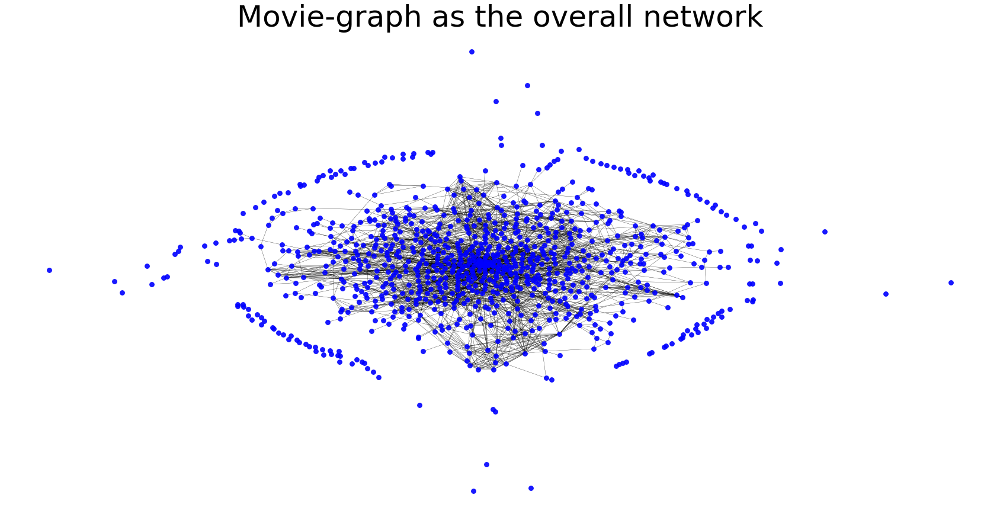

In [29]:
plt.figure(figsize=(30, 15))
plt.title("Movie-graph as the overall network", fontsize = 50)
nx.draw(G_movie, positions_movie, node_size = 60, node_color = 'blue', with_labels=False, width = 0.35, alpha=0.9)
plt.savefig('overall_network.png')

It is seen that the network consists of a big component and some movies around it that are not connected to other movies. The movies which are not connected to other movies are not interesting for the further analyses, since it is assumed that these are not "big players" in the network. From the descriptive analysis in the Basic Stats these movies might be from other countries than USA and UK or just movies with unknown actors.

To overcome this problem, an idea is to work with the biggest component. The biggest component is the largest subgraph, which means that all nodes inside this subgraph is connected. Below the biggest component is extracted:

In [30]:
# The biggest component is found by identifying all connected subgraphs and afterwards choosing the biggest of these
GCC_movie = list(nx.connected_component_subgraphs(G_movie))
GCCs_movie = sorted(GCC_movie, key = len, reverse = True)
G_big_movie = GCCs_movie[0]

The size of the biggest component can tell whether this would is representative for the dataset:

In [31]:
print('Number of nodes in full network:', len(G_movie))
print('Number of nodes in biggest component:', len(G_big_movie))

Number of nodes in full network: 946
Number of nodes in biggest component: 774


There has been removed less than 200 nodes (18 %) and the network still has an appropriate size, thus the further analyses is based on the biggest component. 

The network is now plottet with the different nodes being colored representing their IMDb-score. The IMDb-scores are divided into three different intervals, covering almost the same amount of movies. This is done according to the boxplot from the Basic Stats over the IMDb-scores, where the 33 percentile = 6.1 and 66 percentile = 6.9 is found. 

* The low ranks covers all movies with scores lower than 6.1 with color red
* The medium ranks covers movies with score between 6.1 and 6.9 with color green 
* The high ranks covers movies with scores higher than 6.9 with color blue

In [32]:
# Nodes are colored according to their IMDb-scores
NodeColor = []
for i in G_big_movie:
    if G_big_movie.nodes[i]['imdb_score']  > 6.9:
        NodeColor.append('blue')
    elif G_big_movie.nodes[i]['imdb_score']  < 6.1:
        NodeColor.append('red')
    else:
        NodeColor.append('green')

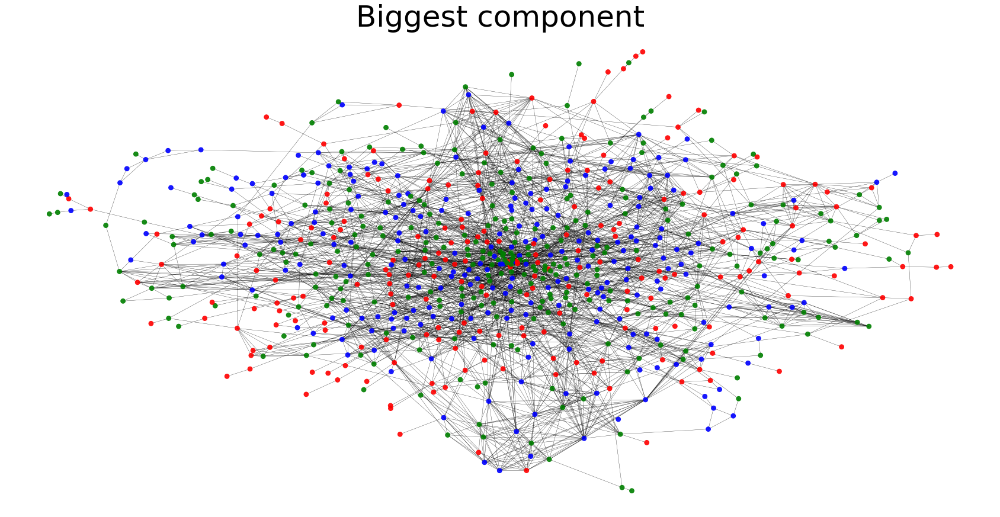

In [33]:
plt.figure(figsize=(30, 15))
plt.title("Biggest component", fontsize = 50)
nx.draw(G_big_movie, positions_movie, node_size= 60, node_color = NodeColor, with_labels=False, width = 0.35, alpha=0.9)
plt.savefig('big_component.png')

As stated above the biggest component is representative for the full network, which is also seen when visualizing it. Therefore this is the graph used for the subsequent analyses. 

#### Degree distribution

To understand the relationship between the nodes, the degree distribution is analyzed. Here, the average degree is calculated and afterwards the degree distribution is plotted:

In [34]:
G_big_movie_degree = list(G_big_movie.degree)

In [35]:
# The average degree is found by taking the mean of the degree of each node
big_movie_degrees = []
for i in range(len(G_big_movie_degree)):
    big_movie_degrees.append(G_big_movie_degree[i][1])
print('Average degree for the network:', np.mean(big_movie_degrees))

Average degree for the network: 8.648578811369509


This means that a given movie on average has 8 other movies it is connected to with shared actorss. Below the distrbution of degrees is plotted. 

In [36]:
l = np.arange(min(big_movie_degrees)-0.5,max(big_movie_degrees)+1.5)

In [37]:
hist2, bins2 = np.histogram(big_movie_degrees,l)

In [38]:
r = np.arange(min(big_movie_degrees),max(big_movie_degrees)+1)

<function matplotlib.pyplot.show(*args, **kw)>

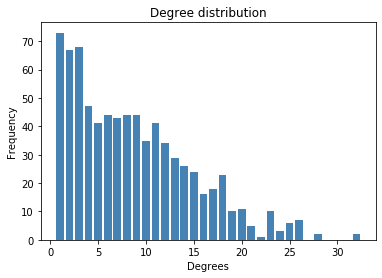

In [39]:
plt.bar(r, hist2,color='steelblue')
plt.xlabel('Degrees')
plt.ylabel('Frequency')
plt.title('Degree distribution')
plt.savefig('degree_distribution.png')
plt.show

The degree distribution shows how the majority of the movies are 'just' connected to between 1-4 other movies. Some movies uses popular actors and are connected to more than 20 movies. 

#### Scale-free network

To investigate whether the movie network is a scale-free network, it is necessary to see if the degree distribution follows a power law distribution. Just from looking at the degree distribution above it should give the indication that the network follows a power law distribution. To be sure the log-log plot of the degree distribution is plotted as well. 

In [40]:
# The x an y values for the loglog plot is found as the keys and values of the degree counts (how many times each degree occur)
degrees = dict(G_big_movie.degree)
degrees_counts = Counter(degrees.values())
degrees_counts_ordered = OrderedDict(sorted(degrees_counts.items()))
degrees_x = list(degrees_counts_ordered.keys())
degrees_y = list(degrees_counts_ordered.values())

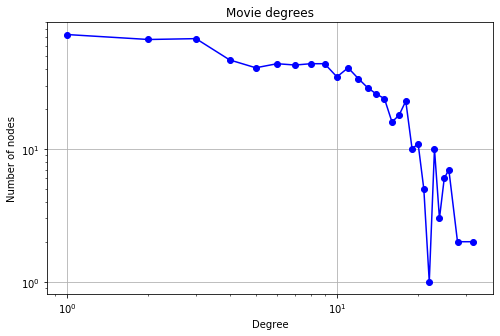

In [41]:
plt.figure(figsize = (8,5))
plt.loglog(degrees_x, degrees_y, 'bo-')
plt.grid(True)
plt.xlabel("Degree")
plt.ylabel("Number of nodes")
plt.title("Movie degrees")
plt.savefig('scale_free.png')
plt.show()

Also from the log-log plot it is clear that the network follows a power law distribution as the line is decreasing. A theoratical power law fit is a straight line deciling through the log-log plot. This is not quite the case here, but it is still declining enough to call the network scale-free. 

In the scale-free networks hubs are expected since the connections in the network follows a preferential attachment. This is also expected for the movie network since some movies with popular actors are more likely to be connected to many other movies where these actors occur. 

#### Degree and Centralities plot

Next step is to analyse how important/popular the nodes are by investigating their degrees and their centralities in the network. By using different measures for the node sizes, different proporties for the nodes in the network are investigated. 

##### Degree

The degree of the nodes represents how many other nodes they are connected to. 
The movie network is now plotted, where the size of the nodes depends on the degree of the given node. 

In [42]:
#The node sizes are equal to their degree muliplied by 15 and then added by 20 (so they will be big enough) 
NodeSize_degree1 = [G_big_movie.degree[i]*10 for i in G_big_movie]
NodeSize_degree = [x+20 for x in NodeSize_degree1]

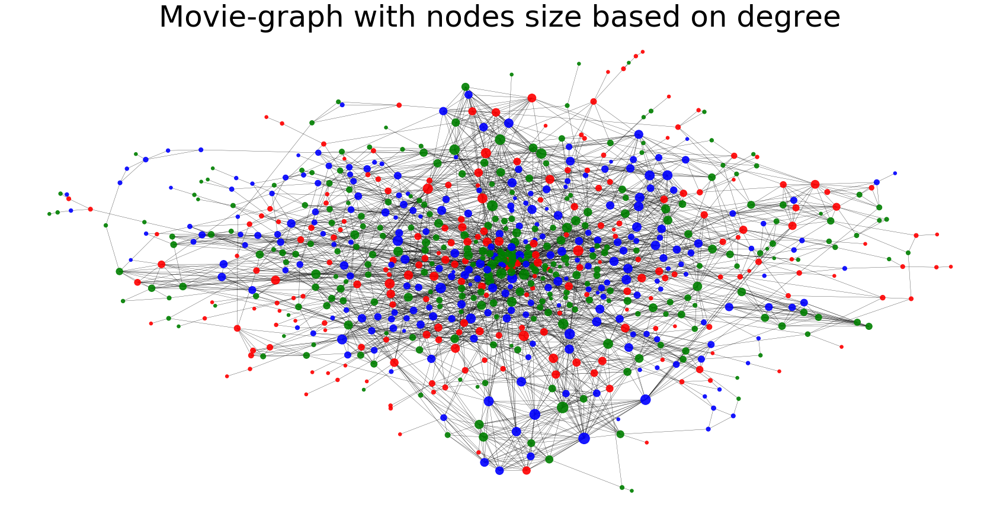

In [43]:
plt.figure(figsize=(30, 15))
plt.title("Movie-graph with nodes size based on degree", fontsize = 50)
nx.draw(G_big_movie, positions_movie, node_size=NodeSize_degree, node_color = NodeColor, with_labels=False, width = 0.35, alpha=0.9)
plt.savefig('graph_degree.png')

The graph above clearly shows the differences in degrees for the different movies. Especially the nodes in the outer circumference has a low degree since they are not connected to that many other nodes (meaning that these movies did not use popular actors appearing in many other movies). 

The network does however show that the biggest nodes are colored blue and green (High and medium ranked movies). Too investigate this further, the top and bottom 10 nodes based on the degree are shown below. 

In [44]:
# The degrees are sorted to find the top ones
degrees_movie_sorted = sorted(G_big_movie_degree, key = lambda x: x[1], reverse = True)

# The movie titles from the above list are saved
degree_index = []
for i in range(10):
    degree_index.append(degrees_movie_sorted[i][0])

# The degrees are put into a dict for easier calls
degree_dict = dict(G_big_movie_degree)

In [45]:
# A dataframe is defined
columns_degree = ['Degree', 'IMDb-score', 'Ranking Category']
df_degree = pd.DataFrame(index=degree_index, columns=columns_degree)

In [46]:
# The data is put into the dataframe
for movie in degree_index:
    df_degree['Degree'][movie] = degree_dict[movie]
    df_degree['IMDb-score'][movie] = list(data.imdb_score[data.Title == movie])[0]
    if list(data.imdb_score[data.Title == movie])[0] > 6.9:
        df_degree['Ranking Category'][movie] = 'High'
    elif list(data.imdb_score[data.Title == movie])[0] < 6.1:
        df_degree['Ranking Category'][movie] = 'Low'
    else:
        df_degree['Ranking Category'][movie] = 'Medium'

In [47]:
df_degree

,Degree,IMDb-score,Ranking Category
Silver_Linings_Playbook,32,7.8,High
Joy,32,6.6,Medium
Date_Night,28,6.3,Medium
American_Hustle,28,7.3,High
This_Is_the_End,26,6.7,Medium
XMen_Days_of_Future_Past,26,8,High
Crazy_Stupid_Love,26,7.4,High
Last_Vegas,26,6.6,Medium
The_Words,26,7.1,High
Magic_Mike,26,6.1,Medium


The list above shows the movies behind the biggest nodes. These movies most likely has 3 popular actors as their top 3 actors which all occur in many other movies. There is an indication of the movies with high degrees also have good IMDb-scores. 

In [48]:
# The degrees are sorted to find the bottom ones
degrees_movie_sorted1 = sorted(G_big_movie_degree, key = lambda x: x[1], reverse = False)

# The movie titles from the above list are saved
degree_index1 = []
for i in range(10):
    degree_index1.append(degrees_movie_sorted1[i][0])

In [49]:
# The dataframe is defined
columns_degree = ['Degree', 'IMDb-score', 'Ranking Category']
df_degree1 = pd.DataFrame(index=degree_index1, columns=columns_degree)

In [50]:
# The data is put into the dataframe
for movie in degree_index1:
    df_degree1['Degree'][movie] = degree_dict[movie]
    df_degree1['IMDb-score'][movie] = list(data.imdb_score[data.Title == movie])[0]
    if list(data.imdb_score[data.Title == movie])[0] > 6.9:
        df_degree1['Ranking Category'][movie] = 'High'
    elif list(data.imdb_score[data.Title == movie])[0] < 6.1:
        df_degree1['Ranking Category'][movie] = 'Low'
    else:
        df_degree1['Ranking Category'][movie] = 'Medium'

In [51]:
df_degree1

,Degree,IMDb-score,Ranking Category
300_Rise_of_an_Empire,1,6.2,Medium
Burlesque,1,6.4,Medium
The_Devil_Inside,1,4.2,Low
Amour,1,7.9,High
Hop,1,5.5,Low
The_Witch,1,6.8,Medium
Cheap_Thrills,1,6.8,Medium
Sparkle,1,5.7,Low
To_Rome_with_Love,1,6.3,Medium
The_Longest_Ride,1,7.1,High


Here the movies behind some of the smallest nodes are shown. These movies do not share any of their top 3 actors with more than one other movie. 

The movies with low degree represents all ranking categories and no clear pattern can be found between the low degree and the IMDb-score. 

##### Betweenness Centrality

The betweenness centrality represents how many shortest paths passing through a node. Thus, this shows the movies essential in connecting other movies.
The movie network is plotted with the nodes sizes corresponding to their betweenness centrality.

In [52]:
b_movie = nx.betweenness_centrality(G_big_movie)

In [53]:
#Letting the size of the nodes depend on their betweenness centrality values. 
NodeSize_between1 = [x*10000 for x in b_movie.values()]
NodeSize_between = [x+20 for x in NodeSize_between1]

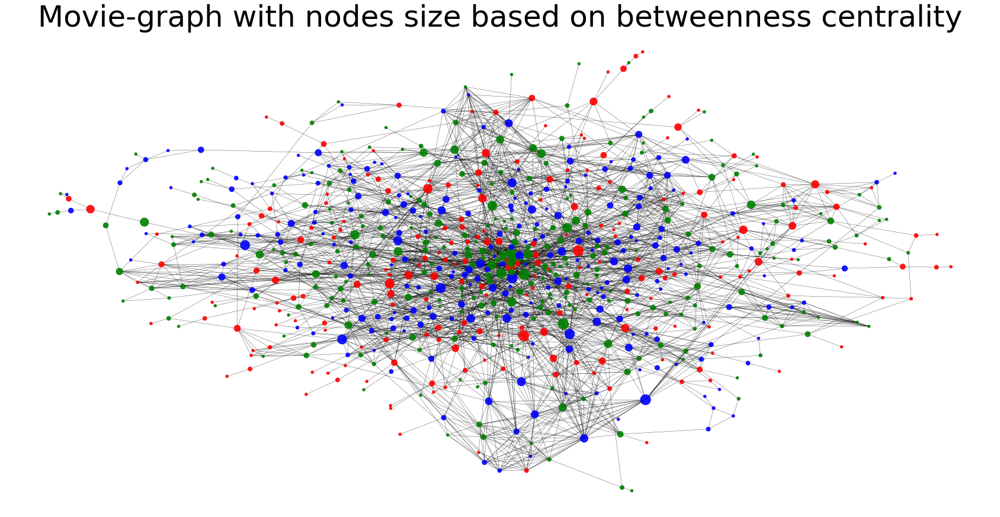

In [54]:
plt.figure(figsize=(30, 15))
plt.title("Movie-graph with nodes size based on betweenness centrality", fontsize = 50)
nx.draw(G_big_movie, positions_movie, node_size=NodeSize_between, node_color = NodeColor, with_labels=False, width = 0.35, alpha=0.9)
plt.savefig('graph_betweenness.png')

The betweenness plot shows some differences in the node sizes, but the differences are not that big here. It shows which movies are the 'hubs' for information flows. This means that a node with high betweenness has actors combining different kind of movies and thus are used in many shortest paths. 

To understand the plot better, the top and bottom nodes based on their betweenness centralities is found below. 

In [55]:
betweenness_movie = []
for movie in b_movie:
    betweenness_movie.append((movie, b_movie[movie]))

In [56]:
# The betweenness centralities are sorted to find the top ones
betweenness_movie_sorted = sorted(betweenness_movie, key = lambda x: x[1], reverse = True)

# The movie titles from the above list are saved
betweenness_index = []
for i in range(10):
    betweenness_index.append(betweenness_movie_sorted[i][0])

# The betweenness centralities are put into a dict for easier calls
betweenness_dict = dict(betweenness_movie)

In [57]:
# The dataframe is defined
columns_betweenness = ['Betweenness_centrality', 'IMDb-score', 'Ranking Category']
df_betweenness = pd.DataFrame(index=betweenness_index, columns=columns_betweenness)

In [58]:
# The data is put into the dataframe
for movie in betweenness_index:
    df_betweenness['Betweenness_centrality'][movie] = betweenness_dict[movie]
    df_betweenness['IMDb-score'][movie] = list(data.imdb_score[data.Title == movie])[0]
    if list(data.imdb_score[data.Title == movie])[0] > 6.9:
        df_betweenness['Ranking Category'][movie] = 'High'
    elif list(data.imdb_score[data.Title == movie])[0] < 6.1:
        df_betweenness['Ranking Category'][movie] = 'Low'
    else:
        df_betweenness['Ranking Category'][movie] = 'Medium'

In [59]:
df_betweenness

,Betweenness_centrality,IMDb-score,Ranking Category
Last_Vegas,0.0289978,6.6,Medium
Aloha,0.0276168,5.4,Low
XMen_Days_of_Future_Past,0.0273137,8,High
The_Incredible_Burt_Wonderstone,0.027099,5.9,Low
Transcendence,0.0265313,6.3,Medium
The_Words,0.0240254,7.1,High
Anchorman_2_The_Legend_Continues,0.0240054,6.3,Medium
The_Lego_Movie,0.0239924,7.8,High
Ted_2,0.0235372,6.4,Medium
Crazy_Stupid_Love,0.0230965,7.4,High


The top movies does not have a high betweenness centrality. Having such a big network with so many shortest paths, it is natural that the betweenness centralities are low. There is not really any pattern in which IMDb-scores the nodes with highest betweenness has. 

In [60]:
# The betweenness centralities are sorted to find the bottom ones
betweenness_movie_sorted1 = sorted(betweenness_movie, key = lambda x: x[1], reverse = False)

# The movie titles from the above list are saved
betweenness_index1 = []
for i in range(10):
    betweenness_index1.append(betweenness_movie_sorted1[i][0])

In [61]:
# A dataframe is defined
columns_betweenness = ['Betweenness_centrality', 'IMDb-score', 'Ranking Category']
df_betweenness1 = pd.DataFrame(index=betweenness_index1, columns=columns_betweenness)

In [62]:
# The data is put into the dataframe
for movie in betweenness_index1:
    df_betweenness1['Betweenness_centrality'][movie] = betweenness_dict[movie]
    df_betweenness1['IMDb-score'][movie] = list(data.imdb_score[data.Title == movie])[0]
    if list(data.imdb_score[data.Title == movie])[0] > 6.9:
        df_betweenness1['Ranking Category'][movie] = 'High'
    elif list(data.imdb_score[data.Title == movie])[0] < 6.1:
        df_betweenness1['Ranking Category'][movie] = 'Low'
    else:
        df_betweenness1['Ranking Category'][movie] = 'Medium'

In [63]:
df_betweenness1

,Betweenness_centrality,IMDb-score,Ranking Category
Captive,0,5.3,Low
The_Tempest,0,5.4,Low
Weekend,0,7.7,High
The_Boxtrolls,0,6.8,Medium
Robot_&_Frank,0,7.1,High
The_Best_Offer,0,7.8,High
127_Hours,0,7.6,High
The_Other_Woman,0,6,Low
Hot_Tub_Time_Machine,0,6.4,Medium
300_Rise_of_an_Empire,0,6.2,Medium


The movies with the lowest betweenness centrality has values of 0 meaning that not a single shortest path goes through the node. Thus these movies will most likely also be movies with a low degree. Agian there is no pattern of these nodes having low scores. 

Overall the betweenness centrality does not contribute with new insight. 

##### Eigenvector Centrality

The eigenvector centrality measures the influence of a node in the network. Scores are assigned so connections to high scoring nodes contribute more to the score of the node than connections to low scoring nodes. A high eigenvector centrality then means that a node is connected to many other nodes who also have a high score. The network is plotted with node sizes representing their eigenvector centrality. 

In [64]:
ev_movie = nx.eigenvector_centrality(G_big_movie)

In [65]:
# Nodesizes are based on the eigenvector centrality of each node
NodeSize_eigen1 = [x*3000 for x in ev_movie.values()]
NodeSize_eigen = [x+20 for x in NodeSize_eigen1]

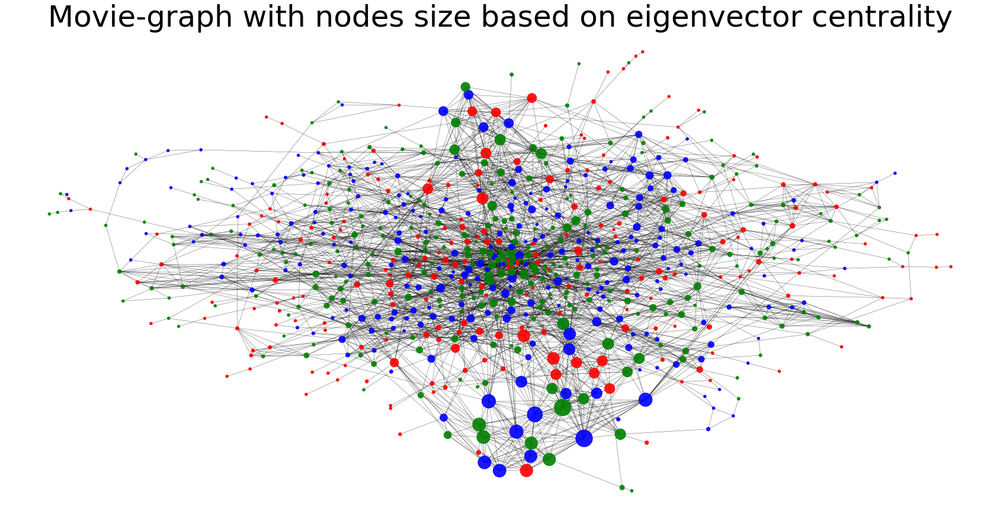

In [66]:
plt.figure(figsize=(30, 15))
plt.title("Movie-graph with nodes size based on eigenvector centrality", fontsize = 50)
nx.draw(G_big_movie, positions_movie, node_size=NodeSize_eigen, node_color = NodeColor, with_labels=False, width = 0.35, alpha=0.9)
plt.savefig('grap_eigenvector.png')

The plot shows how the popular nodes are connected to each other. There is pattern showing that the high and medium ranked movies have the high eigenvector centralities. To understand them better the top and bottom 10 eigenvector centrality nodes are found below.  

In [67]:
eigenvector_movie = []
for movie in ev_movie:
    eigenvector_movie.append((movie, ev_movie[movie]))

In [68]:
# The eigenvector centralities are sorted to find the top ones
eigenvector_movie_sorted = sorted(eigenvector_movie, key = lambda x: x[1], reverse = True)

# The movie titles from the above list are saved
eigenvector_index = []
for i in range(10):
    eigenvector_index.append(eigenvector_movie_sorted[i][0])

# The eigenvector centralities are put into a dict for easier calls
eigenvector_dict = dict(eigenvector_movie)

In [69]:
# The dataframe is defined
columns_eigenvector = ['Eigenvector_centrality', 'IMDb-score', 'Ranking Category']
df_eigenvector = pd.DataFrame(index=eigenvector_index, columns=columns_eigenvector)

In [70]:
# The data is put into the dataframe
for movie in eigenvector_index:
    df_eigenvector['Eigenvector_centrality'][movie] = eigenvector_dict[movie]
    df_eigenvector['IMDb-score'][movie] = list(data.imdb_score[data.Title == movie])[0]
    if list(data.imdb_score[data.Title == movie])[0] > 6.9:
        df_eigenvector['Ranking Category'][movie] = 'High'
    elif list(data.imdb_score[data.Title == movie])[0] < 6.1:
        df_eigenvector['Ranking Category'][movie] = 'Low'
    else:
        df_eigenvector['Ranking Category'][movie] = 'Medium'

In [71]:
df_eigenvector

,Eigenvector_centrality,IMDb-score,Ranking Category
Silver_Linings_Playbook,0.260227,7.8,High
Joy,0.260227,6.6,Medium
American_Hustle,0.211422,7.3,High
XMen_Apocalypse,0.170191,7.3,High
XMen_First_Class,0.165204,7.8,High
XMen_Days_of_Future_Past,0.163337,8,High
The_Hunger_Games_Mockingjay__Part_1,0.156574,6.7,Medium
The_Hunger_Games_Mockingjay__Part_2,0.156574,6.6,Medium
The_Hunger_Games_Catching_Fire,0.151614,7.6,High
The_Hunger_Games,0.150492,7.3,High


It is clear that the top eigenvector centrality movies belongs to the high and medium ranked movies. Fruthermore some of the top eigenvector centrality nodes are also the once with the top degree movies. This makes sense compared to how the eigenvector centrality is calculated. 

In [72]:
# The eigenvector centralities are sorted to find the bottom ones
eigenvector_movie_sorted1 = sorted(eigenvector_movie, key = lambda x: x[1], reverse = False)

# The movie titles from the above list are saved
eigenvector_index1 = []
for i in range(10):
    eigenvector_index1.append(eigenvector_movie_sorted1[i][0])

In [73]:
# The dataframe is defined
columns_eigenvector = ['Eigenvector_centrality', 'IMDb-score', 'Ranking Category']
df_eigenvector1 = pd.DataFrame(index=eigenvector_index1, columns=columns_eigenvector)

In [74]:
# The data is put into the dataframe
for movie in eigenvector_index1:
    df_eigenvector1['Eigenvector_centrality'][movie] = eigenvector_dict[movie]
    df_eigenvector1['IMDb-score'][movie] = list(data.imdb_score[data.Title == movie])[0]
    if list(data.imdb_score[data.Title == movie])[0] > 6.9:
        df_eigenvector1['Ranking Category'][movie] = 'High'
    elif list(data.imdb_score[data.Title == movie])[0] < 6.1:
        df_eigenvector1['Ranking Category'][movie] = 'Low'
    else:
        df_eigenvector1['Ranking Category'][movie] = 'Medium'

In [75]:
df_eigenvector1

,Eigenvector_centrality,IMDb-score,Ranking Category
Project_Almanac,4.03135e-09,6.4,Medium
We_Are_Your_Friends,6.47371e-08,6.1,Medium
The_Switch,6.90721e-08,6.1,Medium
Lone_Survivor,6.90721e-08,7.6,High
Paranormal_Activity_The_Marked_Ones,3.11003e-07,5,Low
Bridesmaids,5.75119e-07,6.8,Medium
Gone_Girl,1.03555e-06,8.1,High
Home_Run,1.04012e-06,6,Low
Bad_Grandpa,1.3137e-06,6.6,Medium
Alpha_and_Omega,2.15732e-06,5.3,Low


The bottom movies has a very low eigenvector centrality, and will most likely be movies which only connect to one or two other movies. However there is not relation with this only being the low ranked movies. 

The eigenvector centrality shows how the highly ranked movies are connected and uses the same actors to influence each other, but no such pattern can be seen for the lower ranked movies. 

#### Assortativity and Disassortativity

It is interesting to examine the degree correlation of the network in order to describe the structure of the networks nodes connections. Here the Pearson correlation is used. 

In [76]:
print('Degree correlation:', nx.degree_pearson_correlation_coefficient(G_big_movie))

Degree correlation: 0.35777010391437913


Since the degree correlation coefficient is greater than 0 the network is disassortative. This means that it has a "hub and spoke structure" where small nodes are likely to connect to bigger nodes. If this is to be combined with the findings from above, it seems like the higher ranked movies both uses popular actors (linking to other big nodes) and less popular actorss occuring in only a few movies (linking to the small nodes.) 

This network structure is a little different from what was assumed. It was assumed that the big nodes/movies using many popular actors would connect to other big nodes where these popular actors also performed. 
This turned out not to be the case. The network is disassortative since there are probably many things which influence decision of which actors to use in a movie. 
  
If the network had represented the friendship of the actorss it would probably be different so that the popular actors in a greater extend are friends with each others. 

#### Communities

The communities are investigated to see which locally dense connected subgraphs exist in the network of movies. It is interesting to see if these communities can be explained to understand which kind of movies are connected. 
This is still on the basis of actors connecting the movies. 

In [77]:
# Making the communities and calculating their modularity 
part_movie = community.best_partition(G_big_movie)

print('Modularity of communities:', community.modularity(part_movie,G_big_movie))

Modularity of communities: 0.6615614776194649


The modularity of 0.66 is a score for how well connected the communities are. When the score is 0 it means that there is no clear connection for the communities and that their connection might as well have been random. The modularity of 0.66 thus show some more strong connection internally in the communities, but a weak connection to the other communities. This high modularity makes it interesting to study the communities further and the graph is agian plotted below with the node size corresponding to the degree of the node and the colors being their communities. 

In [78]:
# Nodesize based on degree sizes
NodeSize1 = [G_big_movie.degree[i]*10 for i in G_big_movie]
NodeSize = [x+20 for x in NodeSize1]

In [79]:
# Node colors based on the given community of each node
node_com = [node[1] for node in part_movie.items()]
partCol = {i: list(np.random.random(size=3)) for i in set(node_com)}
NodeColor = [partCol[i] for i in node_com]

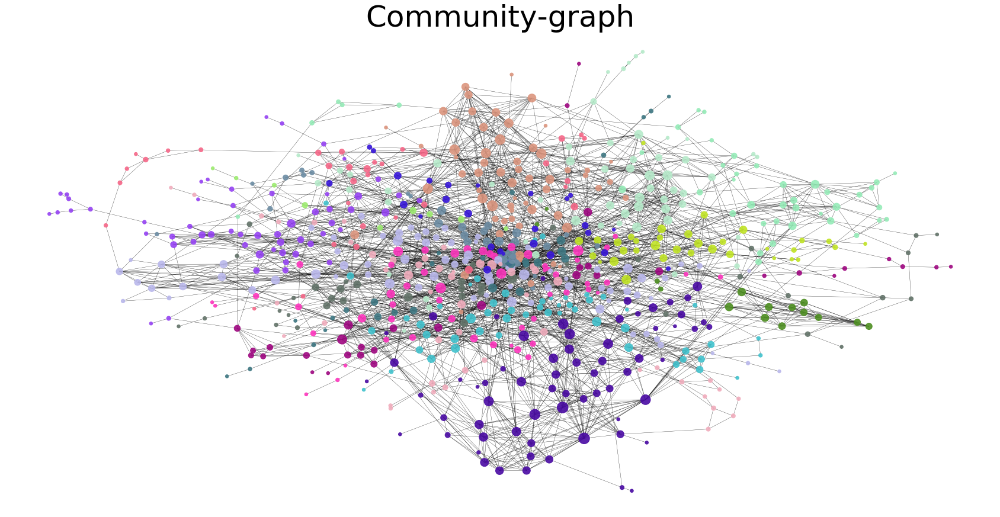

In [80]:
plt.figure(figsize=(30, 15))
plt.title("Community-graph", fontsize = 50)
nx.draw(G_big_movie, positions_movie, node_size=NodeSize, with_labels=False, width = 0.35, node_color=NodeColor, alpha=0.9)
plt.savefig('community_graph.png')

The graph visually supports the high modularity, since the communities are easy too see from each other. 

Belown the number of movies in each community is found. 

In [81]:
numbers = [list(part_movie.values()).count(i) for i in list(set(part_movie.values()))]

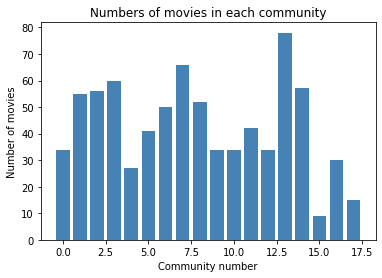

In [82]:
plt.bar(list(set(part_movie.values())), numbers, color = 'steelblue')
plt.title("Numbers of movies in each community")
plt.xlabel("Community number")
plt.ylabel("Number of movies")
plt.savefig('community_numbers.png')
plt.show()

The above barchart shows the 17 different communities, and how many movies belong to the different communities. 

In the following the communities will be investigated further, in order to understand their relation. 

##### Investigation of communities

To get an understanding of the communities, they are here investigated based on the parameters IMDb-score, facebook likes, budget, profit and genres.

In [83]:
# A list of the community names are saved for the upcoming analyses
community_list = list(set(part_movie.values()))

In [84]:
# For each community a list is made with the corresponding movies
for com in community_list:
    globals()['part{}_data'.format(com)] = [movie for movie in part_movie.keys() if part_movie[movie] == com]

The examination is put into a dataframe for nice visualisation:

In [85]:
# For each community the IMDb-scores, facebook likes, budget, and profit for the movies are saved
for com in community_list:
    globals()['com_{}_score'.format(com)] = []
    globals()['com_{}_likes'.format(com)] = []
    globals()['com_{}_budget'.format(com)] = []
    globals()['com_{}_profit'.format(com)] = []
    
    # For each movie in the given community, the information are picked up from the data set
    for movie in globals()['part{}_data'.format(com)]:
        globals()['com_{}_score'.format(com)].extend(list(data.imdb_score[data.Title == movie]))
        globals()['com_{}_likes'.format(com)].extend(list(data.movie_facebook_likes[data.Title == movie]))
        globals()['com_{}_budget'.format(com)].extend(list(data.budget[data.Title == movie]))
        globals()['com_{}_profit'.format(com)].extend(list(dataset.Profit[data.Title == movie]))

In [86]:
# The dataframe is defined
columns = ['IMDb-score', 'Facebook Likes', 'Budget', 'Profit']
df_com = pd.DataFrame(index=community_list, columns=columns)

In [87]:
# The data is applied to the dataframe
for i in range(len(df_com)):
    df_com['IMDb-score'][i] = round(np.mean(globals()['com_{}_score'.format(i)]), 4)
    df_com['Facebook Likes'][i] = round(np.mean(globals()['com_{}_likes'.format(i)]), 4)
    df_com['Budget'][i] = round(np.mean(globals()['com_{}_budget'.format(i)]), 4)
    df_com['Profit'][i] = round(np.mean(globals()['com_{}_profit'.format(i)]).astype(float), 4)
    

In [88]:
df_com

,IMDb-score,Facebook Likes,Budget,Profit
0,6.2235,22970.6,4.51412e+07,6.68284e+06
1,6.56,24145.5,4.03618e+07,2.68771e+07
2,6.5054,29335.5,5.44e+07,1.28239e+07
3,6.6717,36850,4.37617e+07,1.90745e+07
4,6.5889,25750.4,4.34e+07,1.28035e+07
5,6.0098,16158.6,4.78756e+07,1.73735e+07
6,6.416,19680,4.30123e+07,690374
7,6.4182,31424.2,5.3647e+07,3.42947e+07
8,6.7019,40326.9,6.5855e+07,-2.85683e+06
9,6.8824,67088.2,8.14412e+07,1.83253e+07


From this investigation it is first of all seen that all communities have a IMDb-score close to the 50 percentile of 6.5. This means that this attribute does not play a role in defining the communities. The facebook likes are much more varying and might be interesting for what defines the communities. The budget is pretty varying too. The profit is even more varying, thus the money seems to be a part of the division into the communities. But what is the underlying reason for the communities? 

Here, it makes sense to investigate the genres of the communities. Remember, that each movie has several genres assigned, and therefore, and overview of the most frequent genres in each community is made:

In [89]:
# For each community the most frequent genres are found
for com in community_list:
    globals()['com_{}_genres'.format(com)] = []
    
    # For each movie in the given community, the genres are picked up from the data set
    for movie in globals()['part{}_data'.format(com)]:
        globals()['com_{}_genres'.format(com)].extend(list(data.genres[data.Title == movie])[0])
        
    # The genres' occurency in each community is found by using a FreqDist
    globals()['com{}_genre_freq'.format(com)] = nltk.FreqDist(globals()['com_{}_genres'.format(com)]).most_common(5)  
    print('Genres in community', com, ':', globals()['com{}_genre_freq'.format(com)])

Genres in community 0 : [('Drama', 19), ('Thriller', 15), ('Action', 13), ('Comedy', 9), ('Sci-Fi', 8)]
Genres in community 1 : [('Comedy', 30), ('Drama', 27), ('Romance', 16), ('Crime', 12), ('Thriller', 11)]
Genres in community 2 : [('Drama', 31), ('Thriller', 21), ('Action', 19), ('Adventure', 12), ('Crime', 10)]
Genres in community 3 : [('Drama', 36), ('Comedy', 23), ('Thriller', 21), ('Crime', 19), ('Action', 14)]
Genres in community 4 : [('Drama', 18), ('Crime', 10), ('Thriller', 10), ('Comedy', 9), ('Action', 7)]
Genres in community 5 : [('Comedy', 28), ('Drama', 13), ('Adventure', 13), ('Action', 11), ('Family', 11)]
Genres in community 6 : [('Drama', 26), ('Comedy', 17), ('Action', 16), ('Thriller', 15), ('Romance', 12)]
Genres in community 7 : [('Drama', 29), ('Thriller', 29), ('Action', 24), ('Comedy', 21), ('Adventure', 15)]
Genres in community 8 : [('Drama', 26), ('Action', 21), ('Thriller', 17), ('Adventure', 15), ('Sci-Fi', 11)]
Genres in community 9 : [('Action', 18), (

As expected Action, Comedy, Drama and Thriller is seen in many communities. This expectation is based on the frequency plot of the genres from the Basic Stats. By looking closely, it might be evident that the communities could be based on genres, meaning that actors are often acting in the same kind of movies. 

Another more managable way to look into this investigation is by making a confusion matrix, where the rows are the communities and the columns are the genres:

In [90]:
# The matrix is defined with the right dimensions (communities X genres)
B = len(genres)
C = len(community_list)
D = np.zeros((C,B))

In [91]:
# For each movie in each community, the genres are counted and assigned the right places in the matrix (NB: more genres per movie)
for key, val in part_movie.items():
    for i in range(C):
        if val == i:
            if 'Action' in G_big_movie.nodes[key]["genres"]:
                D[i][0] += 1
            if 'Adventure' in G_big_movie.nodes[key]["genres"]:
                D[i][1] += 1
            if 'Animation' in G_big_movie.nodes[key]["genres"]:
                D[i][2] += 1
            if 'Biography' in G_big_movie.nodes[key]["genres"]:
                D[i][3] += 1
            if 'Comedy' in G_big_movie.nodes[key]["genres"]:
                D[i][4] += 1
            if 'Crime' in G_big_movie.nodes[key]["genres"]:
                D[i][5] += 1
            if 'Documentary' in G_big_movie.nodes[key]["genres"]:
                D[i][6] += 1
            if 'Drama' in G_big_movie.nodes[key]["genres"]:
                D[i][7] += 1
            if 'Family' in G_big_movie.nodes[key]["genres"]:
                D[i][8] += 1
            if 'Fantasy' in G_big_movie.nodes[key]["genres"]:
                D[i][9] += 1
            if 'History' in G_big_movie.nodes[key]["genres"]:
                D[i][10] += 1
            if 'Horror' in G_big_movie.nodes[key]["genres"]:
                D[i][11] += 1
            if 'Music' in G_big_movie.nodes[key]["genres"]:
                D[i][12] += 1
            if 'Musical' in G_big_movie.nodes[key]["genres"]:
                D[i][13] += 1
            if 'Mystery' in G_big_movie.nodes[key]["genres"]:
                D[i][14] += 1
            if 'Romance' in G_big_movie.nodes[key]["genres"]:
                D[i][15] += 1
            if 'Sci-Fi' in G_big_movie.nodes[key]["genres"]:
                D[i][16] += 1
            if 'Sport' in G_big_movie.nodes[key]["genres"]:
                D[i][17] += 1
            if 'Thriller' in G_big_movie.nodes[key]["genres"]:
                D[i][18] += 1
            if 'War' in G_big_movie.nodes[key]["genres"]:
                D[i][19] += 1
            if 'Western' in G_big_movie.nodes[key]["genres"]:
                D[i][20] += 1

In [92]:
# The matrix is converted to a dataframe
df_D = pd.DataFrame(D, columns = ('Action', 'Adventure', 'Animation', 'Biography', 'Comedy', 'Crime', 'Documentary',
                                  'Drama', 'Family', 'Fantasy', 'History', 'Horror', 'Music', 'Musical', 'Mystery',
                                  'Romance', 'SciFi', 'Sport', 'Thriller', 'War', 'Western') , index = range(C))


In [93]:
# The dataframe is normalised using the sum of the rows, such that each field shows the percentage
# of movies assigned the given genre in the given community
for i in df_D:
    for j in range(len(df_D)):
        df_D[i][j] = round((df_D[i][j]/df_D.sum(axis = 1)[j])*100, 2)
        
df_D.transpose()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17
Action,13.0,6.37,10.80,7.87,8.97,8.80,10.13,13.19,12.80,16.51,14.15,9.60,3.85,7.85,17.13,13.79,7.41,6.98
Adventure,7.0,3.91,7.15,6.40,6.25,10.59,7.89,8.76,9.63,9.30,7.61,8.97,7.70,9.96,12.57,10.31,7.28,6.39
Animation,2.0,3.31,1.84,2.39,0.00,6.65,2.70,0.61,3.32,0.94,2.86,9.12,4.83,2.30,0.63,0.00,1.19,0.00
Biography,2.0,4.68,5.56,3.62,6.16,0.00,2.73,1.82,4.03,2.81,0.96,0.00,3.87,1.39,1.89,2.22,4.77,5.96
Comedy,9.0,20.37,5.68,14.09,10.92,23.52,11.69,12.85,6.81,8.45,10.52,26.12,18.40,18.74,8.90,8.64,14.18,0.00
Crime,4.0,8.72,6.45,12.31,11.86,5.24,4.28,8.37,6.96,7.55,4.80,4.39,1.95,5.72,7.89,1.96,2.30,0.00
Documentary,0.0,0.00,0.00,0.68,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
Drama,19.0,20.10,20.46,24.43,20.89,11.42,18.78,19.26,18.50,12.32,10.59,8.83,20.47,18.72,16.89,3.85,19.51,24.38
Family,4.0,7.85,5.68,5.16,0.00,9.80,6.10,1.42,6.01,1.91,3.87,10.71,5.88,8.20,4.29,1.86,2.23,0.00
Fantasy,3.0,5.59,5.77,5.97,1.12,6.31,6.19,3.56,5.34,4.77,9.67,6.32,6.87,10.31,9.41,3.66,3.34,1.55


The table above shows, for each community in the columns, the percentage of the genres assigned to the different movies. From this some patterns can be seen where some communities represents are given type movies. For instance the combination Drama, Comedy and Romance being the biggest genres in a community indicate that the given community might contain 'Chick Flick' movies. Therefore, it is relevant to investigate the genres seperatly, since they seem to have a influece. 

#### Network analysis outcomes

The network analysis has shown some tendency of the succes of higher ranked movies being depended of the choice of actors. No clear patterns have been found for lower ranked movies, but this is not essential since this study aims at explaining the successful movies. 

Furthermore it looks like the movies are connected in communites based on some still unkown parameters, which will be investigated more based on their reviews of the movies.  

### Text Analysis

To understand the successful movies better it is in the following chosen to analyse their movie reviews. By doing this for the high/medium/low ranked movies, the communities, and the different genres, it might gain some insight to what makes a movie good, or what different kinds of movies are rated based on. 

First they reviews are downloaded from IMDb using the IMDbPY package and then many different functions are defined to the comming analyses of the reviews. 

#### Extracting the text files

First the IMDbPY package are used to extract the movies reviews based on the movie ids extracted from the movie dataset. 

In [94]:
ia=IMDb()

In [95]:
# For each movie, the IMDb web scrawler is used to get the reviews
for i in range(len(data)):
    
    # The IMDb-IDs for the movies are found in the link in data
    m = re.search(r'[0-9]+', data['movie_imdb_link'][i])
    movie_id = m.group(0)
    
    # The reviews are picked up as dicts which are converted via json.loads
    globals()['{}_reviews'.format(data.Title[i])] = []
    review_temp = ia.get_movie_reviews(movie_id)
    input = json.dumps(review_temp)
    review_dict = json.loads(input) 
    
    # For each picked up review file the correct part is selected and saved for each movie
    for j in range(len(review_dict['data']['reviews'])):
        globals()['{}_reviews'.format(data.Title[i])].append(review_dict['data']['reviews'][j]['content'])

#### Tokenization

The text_prep function is defined to make the reviews on the right form to be analysed. This includes removing stopwords, numbers and punctations. As well as making every word to lower case and tokenizing the text. The function is used in later sections. 

In [96]:
# A function to process the cluster reviews are made. This will result in a list with only words in lower case not 
# included in the stopwords
# The function takes a string as input
def text_prep(text):
    stopwords = nltk.corpus.stopwords.words('english')
    
    # Removing numbers and punctation
    text = re.sub(r'[^\w\s]', '', text)
    text = re.sub(r'[0-9]', '', text)
    
    # Removing punctations from stopwords
    stopwords = [re.sub(r'[^\w\s]', '', t) for t in stopwords]
    
    # Lower case
    text = text.lower()
    
     # Tokenization
    text = nltk.word_tokenize(text)
    
    # Removing stopwords
    text = [t for t in text if t not in stopwords]
    
    return text

#### TF-IDF

Three functions is defined in order to calculated the TF-IDF scores for the different words (https://monkeylearn.com/blog/what-is-tf-idf/). The main purpose of this method is to peanlise the most frequent words accross the documents, so that word clouds will show the unique words for a given document. 

The TF function will calculate the frequency of the words within a given set of reviews. 

The IDF function will find how many set of reviews a word occurd in compared to the corpus of sets. 

The TF-IDF function will then multiply the TF and IDF function together so that a score of a word will both represent the frequency of how much that word appeared in a set and how unique the word is compared to the other sets. 

In [97]:
# A function that calculates the TF-score is made. The TF is calculated by counting the word occurence and divide by the 
# total number of words. The function is returning a dictionary with the word and the corresponding TF-score
# The function takes a frequency dist as input
def tf_comp(tfFreq):
    tf_Dict = {word : float(tfFreq[word])/sum(tfFreq.values()) for word in tfFreq.keys()}
    return tf_Dict

In [98]:
# A function for compution of IDF is made. The IDF is calculated by taking the log of the total number of words and divide it
# by the number of clusters, the word occurs in. This means that words only appearing in a few clusters are weighted highest
# The function returns a dictionary with the word and the corresponding IDF-score
# The function takes a list of several dicts as input
def idf_comp(text_dict_list):
    idf_Dict = {}
    N = len(text_dict_list)
    
    for i in range(N):
        idf_Dict.update((dict.fromkeys(text_dict_list[i].keys(), 0)))
        
    for text in text_dict_list:
        for word, value in text.items():
            if value > 0:
                idf_Dict[word] += 1
                
    for word, value in idf_Dict.items():
        idf_Dict[word] = np.log(N/value)

    return idf_Dict
                

In [99]:
# The TF-IDF-score function is made, where the TF-IDF-score is calculated by multiplying the TF and the IDF score
# The function returns a dictioary with the words and the correlating TF-IDF-score
# The function takes a TF-dictionary and a IDF-dictionary as input
def tf_idf_comp(tfFreq, idf_Dict):
    tf_idf_Dict = {}
    for word, value in tfFreq.items():
        tf_idf_Dict[word] = value * idf_Dict[word]
    return tf_idf_Dict

#### Sentiment analysis

The sentiment analysis is based on a fucntion that finds the overall sentiment of a review. This is done first by defining a sentiment dictionary with different words that has a given sentiment score. For this sentiment analysis, the AFINN-111 file is used. 

Subsequently the reviews are rated with all their words existing in the sentiment dictionary contributing to the final score of a reviews sentiment. 

In [100]:
# A function for making the sentiment dictionary is made 
# The function returns the sentiment dictionary and takes the file as input
def build_sent_dictionary(sent_filename):
    sent_dictionary = {} 
    afinnfile = open(sent_filename)
    for line in afinnfile:
        term, score  = line.split("\t")  
        sent_dictionary[term] = int(score)
    afinnfile.close()  
    return sent_dictionary

In [101]:
sentiment_dict = build_sent_dictionary('AFINN-111.txt')

In [102]:
sentiment_dict

{'abandon': -2,
 'abandoned': -2,
 'abandons': -2,
 'abducted': -2,
 'abduction': -2,
 'abductions': -2,
 'abhor': -3,
 'abhorred': -3,
 'abhorrent': -3,
 'abhors': -3,
 'abilities': 2,
 'ability': 2,
 'aboard': 1,
 'absentee': -1,
 'absentees': -1,
 'absolve': 2,
 'absolved': 2,
 'absolves': 2,
 'absolving': 2,
 'absorbed': 1,
 'abuse': -3,
 'abused': -3,
 'abuses': -3,
 'abusive': -3,
 'accept': 1,
 'accepted': 1,
 'accepting': 1,
 'accepts': 1,
 'accident': -2,
 'accidental': -2,
 'accidentally': -2,
 'accidents': -2,
 'accomplish': 2,
 'accomplished': 2,
 'accomplishes': 2,
 'accusation': -2,
 'accusations': -2,
 'accuse': -2,
 'accused': -2,
 'accuses': -2,
 'accusing': -2,
 'ache': -2,
 'achievable': 1,
 'aching': -2,
 'acquit': 2,
 'acquits': 2,
 'acquitted': 2,
 'acquitting': 2,
 'acrimonious': -3,
 'active': 1,
 'adequate': 1,
 'admire': 3,
 'admired': 3,
 'admires': 3,
 'admiring': 3,
 'admit': -1,
 'admits': -1,
 'admitted': -1,
 'admonish': -2,
 'admonished': -2,
 'adopt': 

In [103]:
# Function for rating the reviews based in above sentiment dict. 
# The function takes reviews (tokenized) as input and returns the scores for the reviews in a list
def sentiment_rate(reviews, sentiment_dict):
    review_scores = []
    for review in reviews:
        score = 0
        count = 1
        for word in review:
            if word in sentiment_dict:
                score += sentiment_dict[word]
                count += 1
                
        # The sentiment for the whole review is the mean score of the words
        score = score/count
        review_scores.append(score)
    return review_scores

#### Other preparations

Lots of reviews will repeat the names of the actors in a movie or the movie name itself. Thus these parts are removed from the reviews so they will not fill too much in the analyses. 

In [104]:
# Preparing the actor names to be removed from the reviews
actor_names = []
for i in range(len(actor_list)):
    actor_names.extend(actor_list[i].split('_'))
actor_names = [actor.lower() for actor in actor_names]

In [105]:
# Preparing the movie titles to be removed from the reviews
movies_temp = list(data.movie_title)
movies_temp = [re.sub('\xa0', '', movie).strip() for movie in movies_temp]

movies = []
for i in range(len(movies_temp)):
    movies.extend(movies_temp[i].split(' '))
movies = [movie.lower() for movie in movies]

#### Text analysis based on ratings

It is investigated how the reviews differs based on the ratings for the movie they are reviewing. Ratings are measured in three different categories based on the 33 and 66 percentiles from the IMDb-score boxplot in Basic Stats. 

This text analysis includes wordclouds, collocations and sentiment analyses. 

##### Preparing data 

The same thresholds for splitting the movies into three cateogires are used agian. Too keep the amount of words to an appropriate level, a sample of 50 movies from each ranking category is selected. Further 2 reviews for each of the selected movies are chosen. 

In [106]:
high_movie = list(data.Title[data.imdb_score > 6.9])

In [107]:
print('Number of high ranked movies:', len(high_movie))

Number of high ranked movies: 305


In [108]:
high_movie_sample = sample(high_movie, 50)

In [109]:
low_movie = list(data.Title[data.imdb_score < 6.1])

In [110]:
print('Number of high ranked movies:', len(low_movie))

Number of high ranked movies: 283


In [111]:
low_movie_sample = sample(low_movie, 50)

In [112]:
medium_movie = []
for i in range(len(data)):
    if data.imdb_score[i] >= 6.1 and data.imdb_score[i] <= 6.9:
        medium_movie.append(data.Title[i])

In [113]:
print('Number of high ranked movies:', len(medium_movie))

Number of high ranked movies: 358


In [114]:
medium_movie_sample = sample(medium_movie, 50)

In [115]:
# A list is made to be used in the loops
x_list = ['high', 'medium', 'low']

In [116]:
#For each movie in each ranking category, 2 reviews are selected for the analyses 
# The reviews are prepared using the text_prep function and saved as both one long list and a list including list for each movie
for x in x_list:
    globals()['{}_movie_words'.format(x)] = []
    globals()['{}_movie_reviews'.format(x)] = []
    for movie in globals()['{}_movie_sample'.format(x)]:
        for review in globals()['{}_reviews'.format(movie)][:2]:
            globals()['{}_movie_words'.format(x)].extend(text_prep(review))
            globals()['{}_movie_reviews'.format(x)].append(text_prep(review))

In [117]:
#The movie name and actor names are removed from the reviews
for x in x_list:
    globals()['{}_movie_words'.format(x)] = [m for m in globals()['{}_movie_words'.format(x)] if m not in actor_names]
    globals()['{}_movie_words'.format(x)] = [m for m in globals()['{}_movie_words'.format(x)] if m not in movies]

In [118]:
for x in x_list:
    print('Number of words in', x, 'ranked movies (sample):', len(globals()['{}_movie_words'.format(x)]))

Number of words in high ranked movies (sample): 14650
Number of words in medium ranked movies (sample): 12917
Number of words in low ranked movies (sample): 11049


It is seen that there overall is more words in the reviews from the high ranked movies, although the category for medium ranked movies contained the most movies. 

##### Wordclouds

TF-IDF is now used to makes the wordclouds for each ranking category. The outcome hopefully shows some patterns in what makes a movie good or bad from the watchers' point of view. 

In [119]:
# For each ranking category a FreqDist is made based on the list of the words in each review
for x in x_list:
    globals()['{}_movie_freq'.format(x)] = nltk.FreqDist(globals()['{}_movie_words'.format(x)])

In [120]:
# For each ranking category the TF-score is calculated based on the tf_comp function
for x in x_list:
    globals()['tf_{}'.format(x)] = tf_comp(globals()['{}_movie_freq'.format(x)])

In [121]:
# The overall IDF-score is calculated based on the idf_comp function
idf_all = idf_comp([tf_high, tf_medium, tf_low])

In [122]:
# For each ranking category the TF-IDF-score is calculated based on the tf_idf_comp function
for x in x_list:
    globals()['tf_idf_{}'.format(x)] = tf_idf_comp(globals()['tf_{}'.format(x)], idf_all)

In [123]:
# For each category, the TF-IDF-scores are sorted for later use
for x in x_list:
    globals()['sort_{}'.format(x)] = sorted(globals()['tf_idf_{}'.format(x)].items(), key = lambda x: x[1], reverse = True)

In [124]:
#The scalar is found for the different categories, to know how much the size of words should be multiplied with 
for x in x_list:
    v = globals()['sort_{}'.format(x)][200][1]
    globals()['scalar_{}'.format(x)] = float(1)/v
    print(x, 'scalar:', globals()['scalar_{}'.format(x)])

high scalar: 6021.89095396912
medium scalar: 5878.780045169429
low scalar: 5028.616607499963


In [125]:
# For each category, an occurency-list is made where the TF-IDF-score is rounded to integer and each word is saved in the list
# as many times as the rounded TF-IDF-score states, whoch makes it possible to plot the wordcloud correctly
for x in x_list:
    globals()['{}_occur'.format(x)] = []
    for word in globals()['tf_idf_{}'.format(x)]:
        globals()['r{}'.format(x)] = int(globals()['tf_idf_{}'.format(x)][word] *  globals()['scalar_{}'.format(x)])
        globals()['{}_occur'.format(x)].append((word + ' ') * globals()['r{}'.format(x)])
    globals()['{}_occur'.format(x)] = ' '.join(globals()['{}_occur'.format(x)])

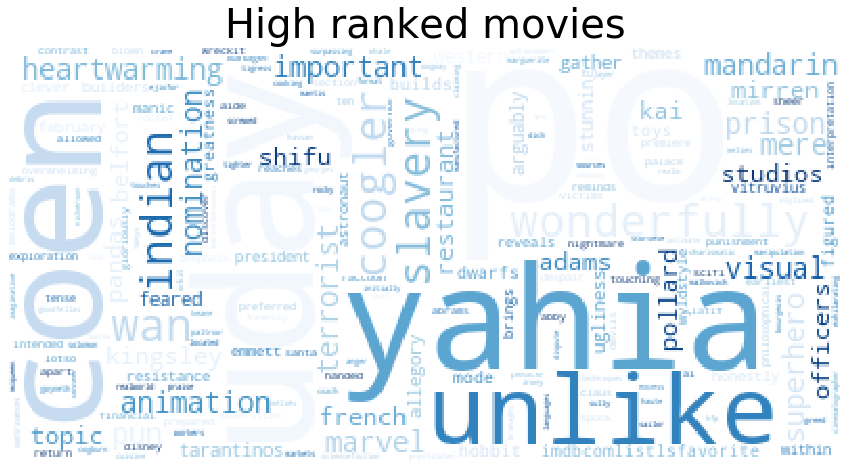

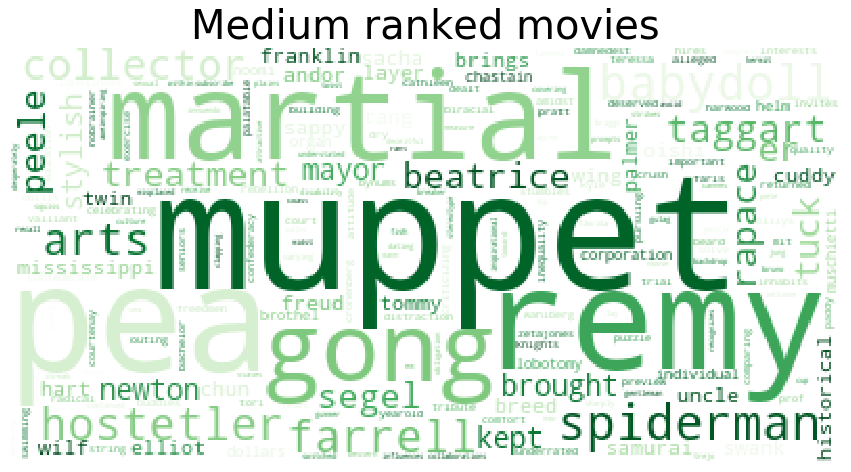

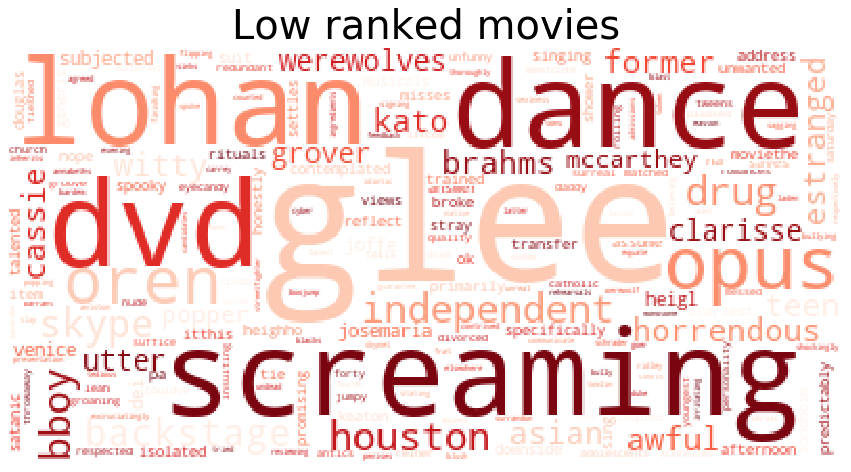

In [126]:
# The wordclouds are made in colors corresponding to the ones used earlier
colors = ["Blues", "Greens", "Reds"]
titles = ["High ranked movies", "Medium ranked movies", "Low ranked movies"]

for i in range(len(x_list)):
    fig = plt.figure(figsize = (15, 20))
    #ax = fig.add_subplot(4,2,i+1)
    wordcloud = WordCloud(collocations = False, 
                       background_color = 'white', 
                       colormap = colors[i]).generate(globals()['{}_occur'.format(x_list[i])])
    plt.title(titles[i], fontsize = 40)
    plt.imshow(wordcloud)
    plt.axis('off')
    plt.savefig(titles[i]+'.png')

The wordclouds for the different ranked movies do not shows any clear words about the experience of the movie, as it was wished for. Most of the words in the wordclouds looks like they are describing the plot of the movies.

Thus it might be necessary to investigate the reviews using other methods than wordclouds. 

##### Collocations

Another way to investigate the reviews in each category is by using collocations, here looking for the 10 most frequent bigrams. Hopefully this analysis will give another insight of the reviews, telling more about the experiences than the wordclouds did. 

In [127]:
# The dataframe is defined
columns_collo_rank = ['Collo1', 'Collo2', 'Collo3', 'Collo4', 'Collo5', 'Collo6', 'Collo7',
                      'Collo8', 'Collo9', 'Collo10']
df_collo_rank = pd.DataFrame(index=x_list, columns=columns_collo_rank)

In [128]:
# Filling the data into the dataframe based on the collocations
for x in x_list:
    bcf = BigramCollocationFinder.from_words(globals()['{}_movie_words'.format(x)])
    n = bcf.nbest(BigramAssocMeasures.likelihood_ratio,10)
    for i in range(10):
        df_collo_rank[columns_collo_rank[i]][x] = n[i]
             
df_collo_rank.transpose()

,high,medium,low
Collo1,"(coen, brothers)","(sweet, pea)","(zac, efron)"
Collo2,"(action, scenes)","(martial, arts)","(gon, na)"
Collo3,"(comic, relief)","(gong, er)","(opus, dei)"
Collo4,"(th, century)","(sacha, baron)","(native, americans)"
Collo5,"(ive, seen)","(wing, chun)","(main, character)"
Collo6,"(thoroughly, enjoyed)","(half, breed)","(high, expectations)"
Collo7,"(crane, mantis)","(noomi, rapace)","(found, footage)"
Collo8,"(moby, dick)","(mental, institution)","(mr, poppers)"
Collo9,"(rooster, cogburn)","(chicken, nuggets)","(action, sequences)"
Collo10,"(start, finish)","(nikolaj, coasterwaldau)","(scares, genuine)"


This analysis gives a little more insight. For instance the high ranked movies are including 'character development' and 'subject matter' which indicates a positive attitude towards the movies. The medium ranked movies tend to be positive as well. The low ranked movies does not clearly fit a negative pattern, though.

The positive/negative attitude in the different ranking categories might be more clear when looking at the entire reviews at once insted of only bigrams. Therefore a sentiment analysis is conducted below. 

##### Sentiment Analysis

Doing this sentiment analysis there is a clear assumption of the sentiment scores of the reviews, reflecting the rankes of the movies. For each review in each category the words will be evalutated whether they occur possitive or negative and assigned a correlated score. The sentiment score of a review is then based on the mean sentiment of the words.

In [129]:
# For each ranking category the sentiment is calculated by using the sentimen_rate function
for x in x_list:
    globals()['{}_sentiment'.format(x)] = sentiment_rate(globals()['{}_movie_reviews'.format(x)], sentiment_dict)

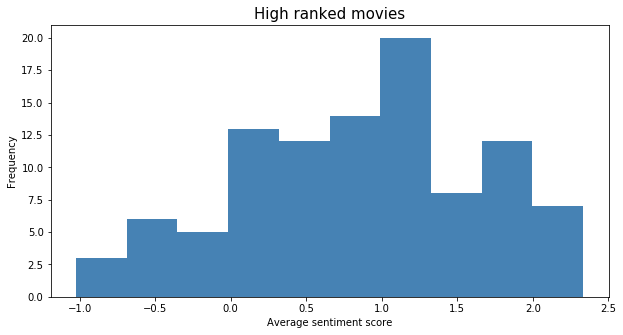

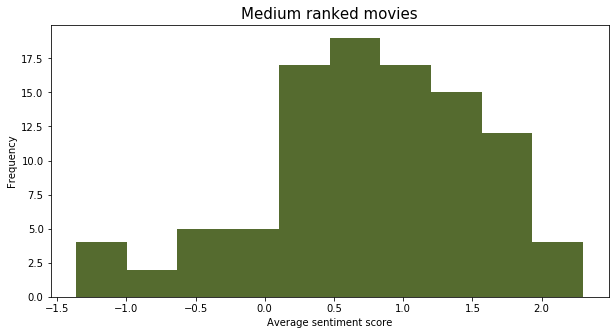

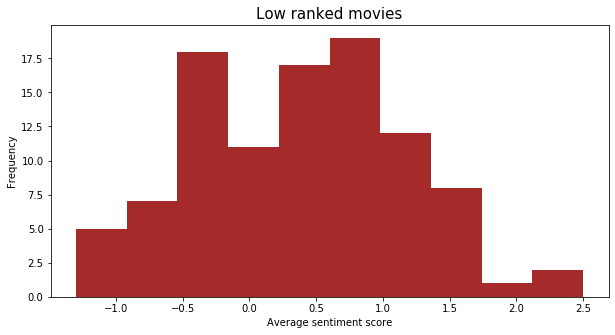

In [130]:
# The distribution of the sentiment rates for each cluster is plotted as histograms

colors = ["steelblue", "darkolivegreen", "brown"]
titles = ["High ranked movies", "Medium ranked movies", "Low ranked movies"]

for i in range(len(x_list)):
    fig = plt.figure(figsize = (10, 5))
    #ax = fig.add_subplot(4,2,i+1)
    plt.hist(globals()['{}_sentiment'.format(x_list[i])], color = colors[i])
    plt.title(titles[i], fontsize = 15)
    plt.xlabel("Average sentiment score")
    plt.ylabel("Frequency")
    plt.savefig('Dist'+titles[i]+'.png')
    plt.show

The distribution of the sentiment scores shows more in depth how the higher ranked movies has higher sentiment scores. Overall the tendency for the outcome is as epected. It gives more insight than the collocations and wordclouds did since it can be confirmed that there is i difference in the reviews of the categories. 

To confirme this even better the mean and standard deviation is found for the different categories. 

In [131]:
# The dataframe is defined
columns_rank = ['Mean', 'Std']
df_rank = pd.DataFrame(index=x_list, columns=columns_rank)

In [132]:
# Filling the data into the dataframe based on the sentiments found above
for x in x_list:
    df_rank['Mean'][x] = round(np.mean(globals()['{}_sentiment'.format(x)]),2)
    df_rank['Std'][x] = round(np.std(globals()['{}_sentiment'.format(x)]),2)
    
df_rank.transpose()

,high,medium,low
Mean,0.85,0.75,0.36
Std,0.78,0.77,0.78


From looking at the average sentiment score for each of the rank categories, it is clear that they follow the assumption of rank categories following the mean sentiment scores.

The reviews can in this division of categories not be used to understand WHAT people have experienced when watching the movie but more what overall mood they have felt. 

#### Text analysis based on communities

Based on the communities found in the community detecting the reviews for each of the communities will be analysed in order to investigate their possible connection even further. The analysis includes wordclouds and collocations. 

##### Preparing data 

The preparation of the reviews mainly consist of using the text_prep function defined earlier. For each movie 2 reviews are extracted for the text analysis.  
This analysis reuses the communities and the community_list from earlier.

In [133]:
# Splitting each movie into their correct community and counting the sizes 
print('Communities sizes:\n')
for com in community_list:
    globals()['data{}'.format(com)] = data[data.Title.isin(globals()['part{}_data'.format(com)])].reset_index(drop = True)
    print('Movies in community', com, ':', len(globals()['data{}'.format(com)]))

Communities sizes:

Movies in community 0 : 34
Movies in community 1 : 55
Movies in community 2 : 56
Movies in community 3 : 60
Movies in community 4 : 27
Movies in community 5 : 41
Movies in community 6 : 50
Movies in community 7 : 66
Movies in community 8 : 52
Movies in community 9 : 34
Movies in community 10 : 34
Movies in community 11 : 42
Movies in community 12 : 34
Movies in community 13 : 78
Movies in community 14 : 57
Movies in community 15 : 9
Movies in community 16 : 30
Movies in community 17 : 15


In [134]:
# For each community, the titles are listed
for com in community_list:
    globals()['com{}_movie_sample'.format(com)] = list(globals()['data{}'.format(com)].Title)

In [135]:
# For each community, 2 reviews for each movie are selected, prepared using the text_prep function and saved 
#in one long list
for com in community_list:
    globals()['com{}_movie_words'.format(com)] = []
    for movie in globals()['com{}_movie_sample'.format(com)]:
        for review in globals()['{}_reviews'.format(movie)][:2]:
            globals()['com{}_movie_words'.format(com)].extend(text_prep(review))

In [136]:
# For each community, removing actor names and movie name from reviews
for com in community_list:
    globals()['com{}_movie_words'.format(com)] = [m for m in globals()['com{}_movie_words'.format(com)] if m not in actor_names]
    globals()['com{}_movie_words'.format(com)] = [m for m in globals()['com{}_movie_words'.format(com)] if m not in movies]

In [137]:
# Now printing all the words from the communities which need to be included in the wordcloud analysis 
for com in community_list:
    print('Number of words in community', com, len(globals()['com{}_movie_words'.format(com)]))

Number of words in community 0 9158
Number of words in community 1 15026
Number of words in community 2 15460
Number of words in community 3 14392
Number of words in community 4 7179
Number of words in community 5 9743
Number of words in community 6 12415
Number of words in community 7 16837
Number of words in community 8 13745
Number of words in community 9 9742
Number of words in community 10 8002
Number of words in community 11 7888
Number of words in community 12 7363
Number of words in community 13 18913
Number of words in community 14 16054
Number of words in community 15 2430
Number of words in community 16 9696
Number of words in community 17 4121


##### Wordclouds

The wordclouds are conducted to show more insight about the different communities based on what the watchers review. Hopefully this will give some knowledge about what differentiates the communities. Once again the TF-IDF function is used to determine the sizes of the words. 

In [138]:
# For each community a FreqDist is made for the words in the reviews
for com in community_list:
    globals()['com{}_movie_freq'.format(com)] = nltk.FreqDist(globals()['com{}_movie_words'.format(com)])

In [139]:
# For each community the TF-score is calculated using the tf_comp function
for com in community_list:
    globals()['tf_com{}'.format(com)] = tf_comp(globals()['com{}_movie_freq'.format(com)])

In [140]:
# The overall IDF-score is calculated using the idf_comp function
idf_all_com = idf_comp([tf_com0, tf_com1, tf_com2, tf_com3, tf_com4, tf_com5, tf_com6, 
                        tf_com7, tf_com8, tf_com9, tf_com10, tf_com11, tf_com12,
                        tf_com13, tf_com14, tf_com15, tf_com16,tf_com17])

In [141]:
# For each community the TF-IDF-score is calculated using the tf_idf_comp function
for com in community_list:
    globals()['tf_idf_com{}'.format(com)] = tf_idf_comp(globals()['tf_com{}'.format(com)], idf_all_com)

In [142]:
# For each community, the TF-IDF-scores are sorted for later use
for com in community_list:
    globals()['sort_com{}'.format(com)] = sorted(globals()['tf_idf_com{}'.format(com)].items(), key = lambda x: x[1], reverse = True)

In [143]:
# Finding the right scalar to multiply size of words with for the wordcloud
for com in community_list:
    v_com = globals()['sort_com{}'.format(com)][200][1]
    globals()['scalar_com{}'.format(com)] = float(1)/v_com
    print('Scalar for community', com, ':', globals()['scalar_com{}'.format(com)])

Scalar for community 0 : 3044.391206073759
Scalar for community 1 : 3096.847954913938
Scalar for community 2 : 2876.1300954940943
Scalar for community 3 : 3275.040737403361
Scalar for community 4 : 2386.512826862144
Scalar for community 5 : 3370.8466647528094
Scalar for community 6 : 2825.1549996430467
Scalar for community 7 : 3132.3028730811166
Scalar for community 8 : 3127.8095424964695
Scalar for community 9 : 3238.5301517329713
Scalar for community 10 : 2768.5020026020707
Scalar for community 11 : 2729.060709388295
Scalar for community 12 : 2547.4231748511684
Scalar for community 13 : 3271.724467333977
Scalar for community 14 : 2777.151409008601
Scalar for community 15 : 840.7223027147004
Scalar for community 16 : 2705.7203175204468
Scalar for community 17 : 1425.7681520523788


In [144]:
# For each community, an occurency-list is made where the TF-IDF-score is rounded to integer and each word is saved in the list
# as many times as the rounded TF-IDF-score states, whoch makes it possible to plot the wordcloud correctly
for com in community_list:
    globals()['com{}_occur'.format(com)] = []
    for word in globals()['tf_idf_com{}'.format(com)]:
        globals()['rcom{}'.format(com)] = int(globals()['tf_idf_com{}'.format(com)][word] *  globals()['scalar_com{}'.format(com)])
        globals()['com{}_occur'.format(com)].append((word + ' ') * globals()['rcom{}'.format(com)])
    globals()['com{}_occur'.format(com)] = ' '.join(globals()['com{}_occur'.format(com)])

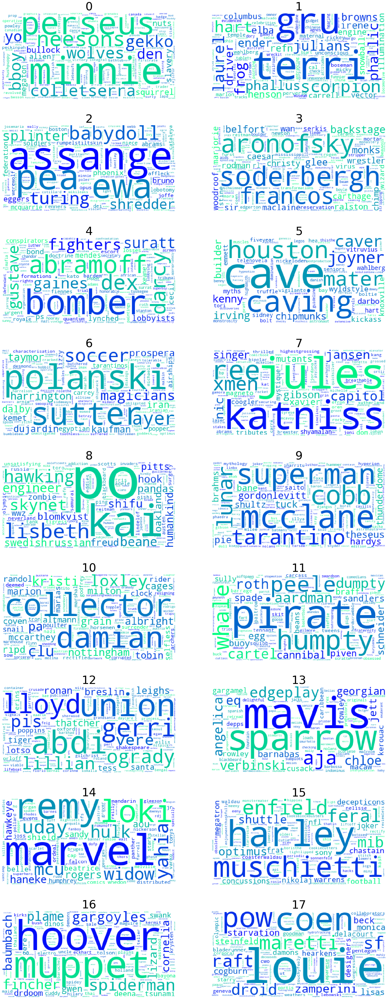

In [145]:
fig = plt.figure(figsize = (30, 160))
for i in range(len(community_list)):
    ax = fig.add_subplot(len(community_list),2,i+1)
    wordcloud = WordCloud(collocations = False, 
                       background_color = 'white', 
                       colormap = "winter").generate(globals()['com{}_occur'.format(community_list[i])])
    plt.title(community_list[i], fontsize = 50)
    ax.imshow(wordcloud)
    ax.axis('off')
plt.savefig('community_wordclouds.png')

The wordclouds for the communities is plotted above. Although it might be difficult to go into depth with each wordcloud there is some overall tendency. 

It looks like many of the communty wordclouds show that the movies described has the same overall category. For example an action movie wordcloud can be found as well as a superhero wordcloud. 
This might strengthen what was found about the communities maybe being based on genres. 

Again the wordclouds shows more about the content of the movie instead of the watchers' experiences. Therefore collocations might provide a deeper insight in this regard. 

##### Collocations for communities

In order of knowing more about the communities the colloctions for each of them is printed below, here being bigrams. This shows which composition of two words appeard the most in the reviews of a community. (The dataframe is divided for use at the website). 

In [146]:
# The dataframe is defined
columns_collo_com = ['Collo1', 'Collo2', 'Collo3', 'Collo4', 'Collo5', 'Collo6', 'Collo7',
                      'Collo8', 'Collo9', 'Collo10']
df_collo_com = pd.DataFrame(index=community_list, columns=columns_collo_com)

In [147]:
# Filling the data into the dataframe based on the collocations
for com in community_list:
    bcf = BigramCollocationFinder.from_words(globals()['com{}_movie_words'.format(com)])
    n = bcf.nbest(BigramAssocMeasures.likelihood_ratio,10)
    for i in range(10):
        df_collo_com[columns_collo_com[i]][com] = n[i]
             
df_collo_com[:6].transpose()

,0,1,2,3,4,5
Collo1,"(alien, ship)","(high, school)","(sweet, pea)","(coen, brothers)","(air, force)","(high, school)"
Collo2,"(pack, wolves)","(r, rating)","(character, development)","(dance, numbers)","(separate, parts)","(even, though)"
Collo3,"(ive, seen)","(taraji, p)","(rest, cast)","(im, sure)","(rights, movement)","(supporting, cast)"
Collo4,"(huge, fan)","(parole, board)","(opus, dei)","(subject, matter)","(tuskegee, airmen)","(crimson, bolt)"
Collo5,"(surly, squirrel)","(perverse, subject)","(mental, institution)","(christy, beam)","(african, americans)","(gon, na)"
Collo6,"(amanda, seyfried)","(p, henson)","(ive, seen)","(r, rating)","(weve, seen)","(soap, opera)"
Collo7,"(lars, von)","(shrink, weapon)","(bin, laden)","(fbi, agent)","(aerial, warfare)","(lot, people)"
Collo8,"(marielle, heller)","(idris, elba)","(helena, bonham)","(toronto, international)","(fuel, oil)","(piece, resistance)"
Collo9,"(russian, mobsters)","(romantic, comedy)","(alien, invasion)","(weta, digital)","(united, states)","(action, sequences)"
Collo10,"(von, trier)","(eye, candy)","(marion, cotillard)","(ive, seen)","(high, school)","(start, finish)"


In [148]:
df_collo_com[6:12].transpose()

,6,7,8,9,10,11
Collo1,"(egyptian, religion)","(zac, efron)","(main, character)","(character, development)","(marion, loxley)","(humpty, dumpty)"
Collo2,"(woody, harrelson)","(jordana, brewster)","(ive, seen)","(sacha, baron)","(rotten, tomatoes)","(ive, seen)"
Collo3,"(action, sequences)","(pleasantly, surprised)","(favorite, xmen)","(mel, gibson)","(action, sequences)","(eye, candy)"
Collo4,"(main, character)","(start, finish)","(half, breed)","(animated, series)","(r, rated)","(even, though)"
Collo5,"(ancient, egyptian)","(nic, jules)","(mr, ping)","(action, sequences)","(comic, books)","(smile, face)"
Collo6,"(even, though)","(character, development)","(even, though)","(works, batmans)","(loose, ends)","(revolves, around)"
Collo7,"(suspension, disbelief)","(set, pieces)","(chicken, nuggets)","(fight, scenes)","(landing, craft)","(negative, review)"
Collo8,"(ive, seen)","(mel, gibson)","(crane, mantis)","(calvin, candie)","(makes, sense)","(mexican, cartel)"
Collo9,"(eel, marsh)","(sperm, donor)","(miles, teller)","(gon, na)","(ive, seen)","(mexican, cartels)"
Collo10,"(morality, police)","(woody, harrelson)","(religious, scientist)","(kal, els)","(took, away)","(arms, dealer)"


In [149]:
df_collo_com[12:].transpose()

,12,13,14,15,16,17
Collo1,"(edward, vere)","(high, school)","(even, though)","(nikolaj, coasterwaldau)","(miles, teller)","(coen, brothers)"
Collo2,"(opening, scene)","(ive, seen)","(ive, seen)","(agent, k)","(chick, flick)","(science, fiction)"
Collo3,"(zac, efron)","(fountain, youth)","(start, finish)","(vs, superman)","(hilary, swank)","(beck, weathers)"
Collo4,"(rita, ogrady)","(make, laugh)","(distributed, walt)","(bass, player)","(tobey, maguire)","(pow, camp)"
Collo5,"(united, states)","(action, scenes)","(joss, whedon)","(multiple, twists)","(pleasantly, surprised)","(rooster, cogburn)"
Collo6,"(jewellery, store)","(revolves, around)","(luc, besson)","(dc, universe)","(von, doom)","(natural, gas)"
Collo7,"(north, pole)","(indominus, rex)","(marvel, studios)","(recommend, anyone)","(production, values)","(cate, blanchett)"
Collo8,"(pole, command)","(im, glad)","(ever, seen)","(scenes, add)","(dinner, table)","(cowboy, hat)"
Collo9,"(rosamund, pike)","(character, development)","(walt, disney)","(sexual, humor)","(jaeden, lieberher)","(defense, minister)"
Collo10,"(surf, ninjas)","(location, location)","(cant, wait)","(sony, pictures)","(reed, richards)","(geneva, convention)"


The collocations give some more insight to the movies of the different communities and shows what the reviewers has been most concerned about. It can help understand the communities better, for example some of the themes of the movies are mentioned agian. Other than that some collocations show more about the experience for instance 'Pleasantly surprised' or 'Visually stunning'. 

However clear patterns between the communities are difficult to find based on the collocations, which again indicate that other patterns are important to community division as well. 

#### Text analysis based on genres

The community detection gave some indication that instead of understanding the movies in relation to the actors, it might be useful to look at them given their different movie genres. 

It is however important to notice that a movie often belongs to different genres and therefore will take part in more than one genre analysis. 

The purpose of the analysis is to see if the genres are important to the success of the movies. The analysis will include wordclouds, collocations, investigation of genres on given parameters and sentiment analysis including wordclouds for positive and negative reviews. 

##### Preparing data

The movies are  divided into the different genres. Since one movies can appear in more genres they will also appear several times in the divisions. 2 reviews from each movie in each genre is used to this text analysis. The text preparation mainly relies on the text_prep function from earlier. 

In [150]:
dataset = dataset.rename(columns = {'Sci-Fi' : 'SciFi'})

In [151]:
# The genrelist for the loops are made
genre_list = list(new.columns)
genre_list = [re.sub('-', '', t) for t in genre_list]

In [152]:
# Saving all movies from different genres
for genre in genre_list:
    globals()['genre_{}_movies'.format(genre)] = []
    for i in range(len(dataset)):
        if dataset[genre][i] == 1 :
            globals()['genre_{}_movies'.format(genre)].append(dataset.Title[i])

In [153]:
# Selecting 2 reviews for each movie and text prepping the reviews
# The reviews are saved in both one long list and a llist with lists for each genre. 
# The reviews are prepared using the text_prep function
for genre in genre_list:
    globals()['genre_{}_movie_words'.format(genre)] = []
    globals()['genre_{}_movie_reviews'.format(genre)] = []
    for movie in globals()['genre_{}_movies'.format(genre)]:
        for review in globals()['{}_reviews'.format(movie)][:2]:
            globals()['genre_{}_movie_words'.format(genre)].extend(text_prep(review))
            globals()['genre_{}_movie_reviews'.format(genre)].append(text_prep(review))

In [154]:
# Removing actor names and movie names
for genre in genre_list:
    globals()['genre_{}_movie_words'.format(com)] = [m for m in globals()['genre_{}_movie_words'.format(genre)] if m not in actor_names]
    globals()['genre_{}_movie_words'.format(com)] = [m for m in globals()['genre_{}_movie_words'.format(com)] if m not in movies]

In [155]:
for genre in genre_list:
    print('Number of words in genre', genre, ':', len(globals()['genre_{}_movie_words'.format(genre)]))

Number of words in genre Action : 104271
Number of words in genre Adventure : 85073
Number of words in genre Animation : 21016
Number of words in genre Biography : 30043
Number of words in genre Comedy : 111760
Number of words in genre Crime : 55045
Number of words in genre Documentary : 4705
Number of words in genre Drama : 163696
Number of words in genre Family : 40162
Number of words in genre Fantasy : 48496
Number of words in genre History : 13746
Number of words in genre Horror : 35017
Number of words in genre Music : 9866
Number of words in genre Musical : 5547
Number of words in genre Mystery : 32467
Number of words in genre Romance : 54216
Number of words in genre SciFi : 56686
Number of words in genre Sport : 9465
Number of words in genre Thriller : 108195
Number of words in genre War : 9390
Number of words in genre Western : 5338


The above print shows how many words take part of the analysis for the different genres. 

##### Wordclouds

The wordclouds are made based on the TF-IDF function. Hopefully they can give some knowledge of what people experience when whatching the different genres. 

In [156]:
# For each genre a FreqDist is made to count the occurence of each word
for genre in genre_list:
    globals()['genre_{}_movie_freq'.format(genre)] = nltk.FreqDist(globals()['genre_{}_movie_words'.format(genre)])

In [157]:
# For each genre the TF-score is calculated using the tf_comp function
for genre in genre_list:
    globals()['tf_genre_{}'.format(genre)] = tf_comp(globals()['genre_{}_movie_freq'.format(genre)])

In [158]:
# The overall IDF-score is calculated using the idf_comp function
idf_all_genre = idf_comp([tf_genre_Action, tf_genre_Adventure, tf_genre_Animation, tf_genre_Biography, 
                        tf_genre_Comedy, tf_genre_Crime, tf_genre_Documentary, tf_genre_Drama, 
                        tf_genre_Family, tf_genre_Fantasy, tf_genre_History, tf_genre_Horror, 
                        tf_genre_Music, tf_genre_Musical, tf_genre_Mystery, tf_genre_Romance,
                        tf_genre_SciFi, tf_genre_Sport, tf_genre_Thriller, tf_genre_War, tf_genre_Western])

In [159]:
# For each genre the TF-IDF-score is calculated using the tf_idf_comp function
for genre in genre_list:
    globals()['tf_idf_genre_{}'.format(genre)] = tf_idf_comp(globals()['tf_genre_{}'.format(genre)], idf_all_genre)

In [160]:
# For each genre, the TF-IDF-scores are sorted for later use
for genre in genre_list:
    globals()['sort_genre_{}'.format(genre)] = sorted(globals()['tf_idf_genre_{}'.format(genre)].items(), key = lambda x: x[1], reverse = True)

In [161]:
# Calculated scalar for each genre to know how much to multiply the words with. 
for genre in genre_list:
    v_genre = globals()['sort_genre_{}'.format(genre)][200][1]
    globals()['scalar_genre_{}'.format(genre)] = float(1)/v_genre
    print('Scalar for', genre, ':', globals()['scalar_genre_{}'.format(genre)])

Scalar for Action : 10871.231548595208
Scalar for Adventure : 9880.138126689635
Scalar for Animation : 6336.884622966355
Scalar for Biography : 6388.389073261241
Scalar for Comedy : 11484.753123132918
Scalar for Crime : 8942.011674746318
Scalar for Documentary : 2000.9566680886817
Scalar for Drama : 13923.426258849942
Scalar for Family : 8540.108576384448
Scalar for Fantasy : 8828.592306899021
Scalar for History : 4789.2649379759405
Scalar for Horror : 7446.067975181869
Scalar for Music : 4195.842399014439
Scalar for Musical : 3345.13694362337
Scalar for Mystery : 8342.368740859347
Scalar for Romance : 9287.170843306134
Scalar for SciFi : 9049.756645997091
Scalar for Sport : 4025.3039029669235
Scalar for Thriller : 11503.374426347236
Scalar for War : 3993.407675526615
Scalar for Western : 2743.1893515697293


In [162]:
# For each genre, an occurency-list is made where the TF-IDF-score is rounded to integer and each word is saved in the list
# as many times as the rounded TF-IDF-score states, whoch makes it possible to plot the wordcloud correctly
for genre in genre_list:
    globals()['genre_{}_occur'.format(genre)] = []
    for word in globals()['tf_idf_genre_{}'.format(genre)]:
        globals()['r_genre_{}'.format(genre)] = int(globals()['tf_idf_genre_{}'.format(genre)][word] *  globals()['scalar_genre_{}'.format(genre)])
        globals()['genre_{}_occur'.format(genre)].append((word + ' ') * globals()['r_genre_{}'.format(genre)])
    globals()['genre_{}_occur'.format(genre)] = ' '.join(globals()['genre_{}_occur'.format(genre)])

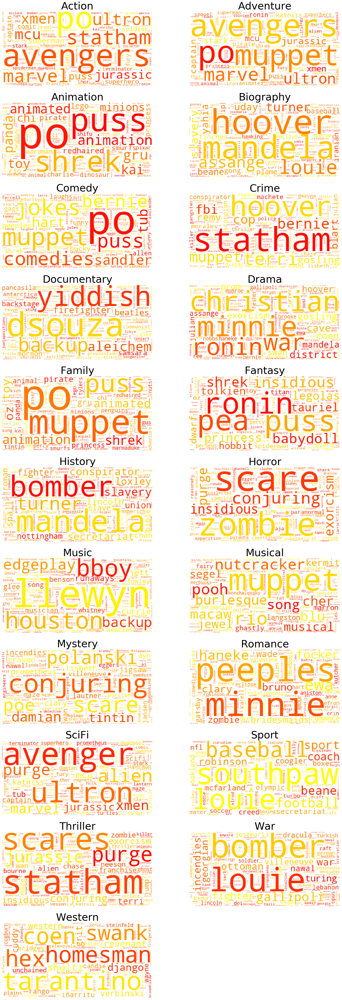

In [163]:
fig = plt.figure(figsize = (30, 170))
for i in range(len(genre_list)):
    ax = fig.add_subplot(len(genre_list),2,i+1)
    wordcloud = WordCloud(collocations = False, 
                       background_color = 'white', 
                       colormap = "autumn").generate(globals()['genre_{}_occur'.format(genre_list[i])])
    plt.title(genre_list[i], fontsize = 50)
    ax.imshow(wordcloud)
    ax.axis('off')
plt.savefig('genre_wordclouds.png')

The above wordclouds is shown for each genre. The words in the wordclouds is very consistent with the genre of the wordclouds. It is clear that some of the movies recur in more than one genre. 

The word cloud primarily shows words related to the movies in that genre and not so much about the experience or quality of the movies. Thus it is important to study the reviews in different ways.

##### Collocations for genres

The genres can also be further investigated using the collocations as bigrams. (The dataframe is splitted up due to the visualisation at the website). 

In [164]:
# The dataframe is defined
columns_collo_genre = ['Collo1', 'Collo2', 'Collo3', 'Collo4', 'Collo5', 'Collo6', 'Collo7',
                      'Collo8', 'Collo9', 'Collo10']
df_collo_genre = pd.DataFrame(index=genre_list, columns=columns_collo_genre)

In [165]:
# Filling the data into the dataframe based on the collocations
for genre in genre_list:
    bcf = BigramCollocationFinder.from_words(globals()['genre_{}_movie_words'.format(genre)])
    n = bcf.nbest(BigramAssocMeasures.likelihood_ratio,10)
    for i in range(10):
        df_collo_genre[columns_collo_genre[i]][genre] = n[i]
             
df_collo_genre[:5].transpose()

,Action,Adventure,Animation,Biography,Comedy
Collo1,"(iron, man)","(iron, man)","(charlie, brown)","(ip, man)","(high, school)"
Collo2,"(captain, america)","(captain, america)","(toy, story)","(true, story)","(ive, seen)"
Collo3,"(action, sequences)","(special, effects)","(kung, fu)","(based, true)","(charlie, brown)"
Collo4,"(special, effects)","(charlie, brown)","(ice, age)","(civil, rights)","(year, old)"
Collo5,"(bad, guys)","(action, sequences)","(redhaired, girl)","(years, ago)","(de, niro)"
Collo6,"(comic, book)","(star, trek)","(little, redhaired)","(martial, arts)","(toy, story)"
Collo7,"(star, trek)","(character, development)","(fu, panda)","(united, states)","(kung, fu)"
Collo8,"(character, development)","(even, though)","(happy, feet)","(real, life)","(new, york)"
Collo9,"(ip, man)","(mad, max)","(monsters, university)","(kings, speech)","(last, night)"
Collo10,"(jason, statham)","(year, old)","(voice, acting)","(gong, er)","(pleasantly, surprised)"


In [166]:
df_collo_genre[5:10].transpose()

,Crime,Documentary,Drama,Family,Fantasy
Collo1,"(jason, statham)","(rock, roll)","(new, york)","(charlie, brown)","(special, effects)"
Collo2,"(new, york)","(around, world)","(ive, seen)","(toy, story)","(year, old)"
Collo3,"(paul, walker)","(ray, charles)","(even, though)","(kung, fu)","(sweet, pea)"
Collo4,"(vin, diesel)","(rolling, stones)","(high, school)","(year, old)","(snow, white)"
Collo5,"(ive, seen)","(pemuda, pancasila)","(character, development)","(ice, age)","(character, development)"
Collo6,"(dwayne, johnson)","(katy, perry)","(true, story)","(im, sure)","(even, though)"
Collo7,"(ryan, gosling)","(churchill, bust)","(pleasantly, surprised)","(special, effects)","(toy, story)"
Collo8,"(alex, cross)","(dance, numbers)","(subject, matter)","(redhaired, girl)","(lord, rings)"
Collo9,"(fast, furious)","(highly, recommend)","(special, effects)","(snow, white)","(paranormal, activity)"
Collo10,"(want, see)","(year, ice)","(real, life)","(ive, seen)","(days, future)"


In [167]:
df_collo_genre[10:15].transpose()

,History,Horror,Music,Musical,Mystery
Collo1,"(bridge, spies)","(paranormal, activity)","(black, men)","(happy, feet)","(alex, cross)"
Collo2,"(ip, man)","(jump, scares)","(magic, mike)","(winnie, pooh)","(jump, scares)"
Collo3,"(jackie, chan)","(special, effects)","(mary, poppins)","(johnny, x)","(ryan, reynolds)"
Collo4,"(air, force)","(horror, movies)","(mick, jagger)","(jim, henson)","(special, effects)"
Collo5,"(civil, war)","(horror, movie)","(rebel, wilson)","(location, location)","(dragon, tattoo)"
Collo6,"(even, though)","(james, wan)","(llewyn, davis)","(box, office)","(matthew, fox)"
Collo7,"(kings, speech)","(found, footage)","(country, strong)","(jason, segel)","(riding, hood)"
Collo8,"(silk, road)","(even, though)","(rock, roll)","(even, though)","(sherlock, holmes)"
Collo9,"(true, story)","(riding, hood)","(whitney, houston)","(fairy, tale)","(folk, tale)"
Collo10,"(mary, poppins)","(leigh, whannell)","(box, office)","(ive, seen)","(found, footage)"


In [168]:
df_collo_genre[15:19].transpose()

,Romance,SciFi,Sport,Thriller
Collo1,"(new, york)","(iron, man)","(true, story)","(special, effects)"
Collo2,"(pleasantly, surprised)","(captain, america)","(dennis, quaid)","(ive, seen)"
Collo3,"(even, though)","(special, effects)","(kevin, costner)","(bad, guys)"
Collo4,"(zac, efron)","(star, trek)","(sylvester, stallone)","(new, york)"
Collo5,"(read, book)","(mad, max)","(hugh, jackman)","(character, development)"
Collo6,"(high, school)","(character, development)","(raging, bull)","(action, sequences)"
Collo7,"(romantic, comedy)","(science, fiction)","(draft, day)","(jason, statham)"
Collo8,"(last, night)","(tony, stark)","(high, school)","(mad, max)"
Collo9,"(year, old)","(hunger, games)","(take, seriously)","(paul, walker)"
Collo10,"(ive, seen)","(winter, soldier)","(michael, b)","(jump, scares)"


In [169]:
df_collo_genre[19:].transpose()

,War,Western
Collo1,"(civil, war)","(true, grit)"
Collo2,"(matt, damon)","(jonah, hex)"
Collo3,"(air, force)","(coen, brothers)"
Collo4,"(gary, ross)","(josh, brolin)"
Collo5,"(world, war)","(jeff, bridges)"
Collo6,"(middle, east)","(john, wayne)"
Collo7,"(opus, dei)","(lone, ranger)"
Collo8,"(russell, crowe)","(lee, jones)"
Collo9,"(alan, turing)","(hateful, eight)"
Collo10,"(andy, garcia)","(tommy, lee)"


The collocations for the genres, once again shows a good connecion to the genres as expected. They underline which movies and thems is in the different categories. Furthermore some collocations point in the direction of the experiences, as for example 'Character development' or 'take seriously'.

##### Investigation of genres

It is relevant to investigate the genres on a deeper level to see how each genre performs. This is done based on the attributes IMDb-score, Facebook likes, budget and profit. Remember that each movie has several genres.

In [170]:
# For each genre the IMDb-scores, facebook likes, budget, and profit for the movies are saved
for genre in genre_list:
    globals()['genre_{}_score'.format(genre)] = []
    globals()['genre_{}_likes'.format(genre)] = []
    globals()['genre_{}_budget'.format(genre)] = []
    globals()['genre_{}_profit'.format(genre)] = []
    
    # For each movie in the given genre, the information are picked up from the data set
    for i in range(len(dataset)):
        if dataset[genre][i] == 1 :
            globals()['genre_{}_score'.format(genre)].append(dataset.imdb_score[i])
            globals()['genre_{}_likes'.format(genre)].append(dataset.movie_facebook_likes[i])
            globals()['genre_{}_budget'.format(genre)].append(dataset.budget[i])
            globals()['genre_{}_profit'.format(genre)].append(dataset.Profit[i])


In [171]:
# The dataframe is defined
columns = ['IMDb-score', 'Facebook Likes', 'Budget', 'Profit']
df_genre = pd.DataFrame(index=genre_list, columns=columns)

In [172]:
for genre in genre_list:
    df_genre['IMDb-score'][genre] = round(np.mean(globals()['genre_{}_score'.format(genre)]), 4)
    df_genre['Facebook Likes'][genre] = round(np.mean(globals()['genre_{}_likes'.format(genre)]), 4)
    df_genre['Budget'][genre] = round(np.mean(globals()['genre_{}_budget'.format(genre)]), 4)
    df_genre['Profit'][genre] = round(np.mean(globals()['genre_{}_profit'.format(genre)]).astype(float), 4)
    

In [173]:
df_genre

,IMDb-score,Facebook Likes,Budget,Profit
Action,6.3766,34501.8,8.53647e+07,4.69672e+06
Adventure,6.6397,42906.5,1.16859e+08,1.58014e+07
Animation,6.7318,20606.1,1.03921e+08,3.56449e+07
Biography,7.1487,32217.9,2.68509e+07,1.62545e+07
Comedy,6.2772,18591.5,4.53486e+07,1.95706e+07
Crime,6.5788,24664.7,3.55938e+07,9.11937e+06
Documentary,6.3571,8792,5.65893e+06,1.79996e+07
Drama,6.7179,28501.8,3.19868e+07,8.8411e+06
Family,6.4198,18105.7,9.16182e+07,2.04794e+07
Fantasy,6.3,31989,9.18986e+07,6.68404e+06


The genres differs much more than the communities investigated earlier, which might be because the genre division is more clear than the communities. It is interesting how popular history and biography are and how little money western earns. 

##### Sentiment analysis for genres

Next step is to analyse whether there are differences in the sentiment of the reviews depending on the genres. The sentiment is found for each review in the genres with the function of sentiment_rate. Hopefully this will tell more about the experiences than the wordclouds and collocations were able to do since this analysis looks at all of the words in all reviews. 

In [174]:
# For each genre the sentiment is calculated using the sentiment_rate function
for genre in genre_list:
    globals()['genre_{}_sentiment'.format(genre)] = sentiment_rate(globals()['genre_{}_movie_reviews'.format(genre)], sentiment_dict)

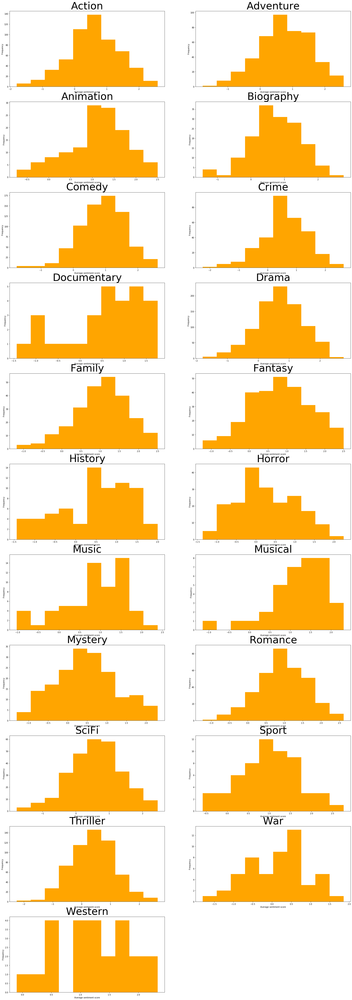

In [175]:
# The distribution of the sentiment rates for each genre is plotted as histograms

fig = plt.figure(figsize = (30, 170))
for i in range(len(genre_list)):
    ax = fig.add_subplot(len(genre_list),2,i+1)
    plt.hist(globals()['genre_{}_sentiment'.format(genre_list[i])], color = 'orange')
    plt.title(genre_list[i], fontsize = 50)
    plt.xlabel("Average sentiment score")
    plt.ylabel("Frequency")
    plt.show
plt.savefig('genre_sentiment.png')

The distributions are very different. The biggest genres seems to be normaly distributed where some of the smaller genres look odd. It can be difficult to compare the distributions to each other, thus their mean and standard deviation are examined below.

In [176]:
# The dataframe is defined
columns_genre = ['Mean', 'Std']
df_genre = pd.DataFrame(index=genre_list, columns=columns_genre)

In [177]:
# Filling the data into the dataframe based on the sentiments found above
for genre in genre_list:
    df_genre['Mean'][genre] = round(np.mean(globals()['genre_{}_sentiment'.format(genre)]),2)
    df_genre['Std'][genre] = round(np.std(globals()['genre_{}_sentiment'.format(genre)]),2)
    
df_genre

,Mean,Std
Action,0.59,0.78
Adventure,0.76,0.78
Animation,1.11,0.7
Biography,0.73,0.74
Comedy,0.91,0.69
Crime,0.57,0.77
Documentary,0.62,0.9
Drama,0.69,0.75
Family,1.02,0.71
Fantasy,0.83,0.8


Again the patterns are very different for the genres which might indicate that the choice of genre influences the success. On the other hand, it is worth keeping in mind that for instance when writing about horror movies the words might have are more negative sentiment due to the contents of this genre. This can be seen in other genres too, due to this tendency it is worth looking into the wordclouds for the positve and negative reviews. 

##### Positive/negative wordclouds for genres

Now, when the sentiment analysis is conducted, it is possible to make wordclouds based on +/- 2 x std for each genre to see if the positive and negative reviews can give a more clear expression of the experiences.

In [178]:
# Two functions are made that calculates the negative and positive reviews. 
# The functions return a list of sentiment scores and takes the take lists and the sentiment dictionary and a threshold as input
# The output is based on wether the sentiment rates are lower or higher than the threshold
def sentiment_rate_negative(texts, sentiment_dict, thres):
    text_score = []
    for text in texts:
        score = 0
        count = 1
        for word in text:
            if word in sentiment_dict:
                score += sentiment_dict[word]
                count += 1
        score = score/count
        if score < thres:
            text_score.append(text)
    return text_score 

def sentiment_rate_positive(texts, sentiment_dict, thres):
    text_score = []
    for text in texts:
        score = 0
        count = 1
        for word in text:
            if word in sentiment_dict:
                score += sentiment_dict[word]
                count += 1
        score = score/count
        if score > thres:
            text_score.append(text)
    return text_score 

First, the positive wordclouds are made in the same way as earlier seen, but with the only difference that it only contains reviews having a sentiment rate over the mean plus 2 times the standard deviation for the given genre:

In [179]:
# For each genre, the positive reviews are found by using the above function
# The threshold is defined as mean + 2 * std
for genre in genre_list: 
    globals()['genre_{}_sentiment_pos'.format(genre)] = sentiment_rate_negative(globals()['genre_{}_movie_reviews'.format(genre)], 
                                                                           sentiment_dict, 
                                                                          np.mean(globals()['genre_{}_sentiment'.format(genre)] + 
                                                                                  (2*np.std(globals()['genre_{}_sentiment'.format(genre)]))))

In [180]:
# For each genre, the frequency of the positive words are found 
for genre in genre_list:
    globals()['genre_{}_tf_Freq_pos'.format(genre)] = nltk.FreqDist(globals()['genre_{}_sentiment_pos'.format(genre)][0])

In [181]:
# For the positive words in each genre, the TF, IDF and TF-IDF-scores are found
for genre in genre_list:
    globals()['genre_{}_tf_pos'.format(genre)] = tf_comp(globals()['genre_{}_tf_Freq_pos'.format(genre)])    

idf_all_genre_pos = idf_comp([genre_Action_tf_pos, genre_Adventure_tf_pos, genre_Animation_tf_pos, genre_Biography_tf_pos, 
                        genre_Comedy_tf_pos, genre_Crime_tf_pos, genre_Documentary_tf_pos, genre_Drama_tf_pos, 
                        genre_Family_tf_pos, genre_Fantasy_tf_pos, genre_History_tf_pos, genre_Horror_tf_pos, 
                        genre_Music_tf_pos, genre_Musical_tf_pos, genre_Mystery_tf_pos, genre_Romance_tf_pos,
                        genre_SciFi_tf_pos, genre_Sport_tf_pos, genre_Thriller_tf_pos, genre_War_tf_pos, genre_Western_tf_pos])

for genre in genre_list:
    globals()['genre_{}_tf_idf_pos'.format(genre)] = tf_idf_comp(globals()['genre_{}_tf_Freq_pos'.format(genre)], 
                                                                 idf_all_genre_pos) 

In [182]:
# The positive words in each genre are sorted
for genre in genre_list:
    globals()['genre_{}_x_pos'.format(genre)] = sorted(globals()['genre_{}_tf_idf_pos'.format(genre)].items(), 
                                                       key = lambda x: x[1], reverse = True)

In [183]:
# For each genre, the occurency-list is made for the positive words
for genre in genre_list:
    globals()['genre_{}_occur_pos'.format(genre)] = []
    for word in globals()['genre_{}_tf_idf_pos'.format(genre)]:
        globals()['genre_{}_r_pos'.format(genre)] = int(globals()['genre_{}_tf_idf_pos'.format(genre)][word])
        globals()['genre_{}_occur_pos'.format(genre)].append((word + ' ') * globals()['genre_{}_r_pos'.format(genre)])
    globals()['genre_{}_occur_pos'.format(genre)] = ' '.join(globals()['genre_{}_occur_pos'.format(genre)])

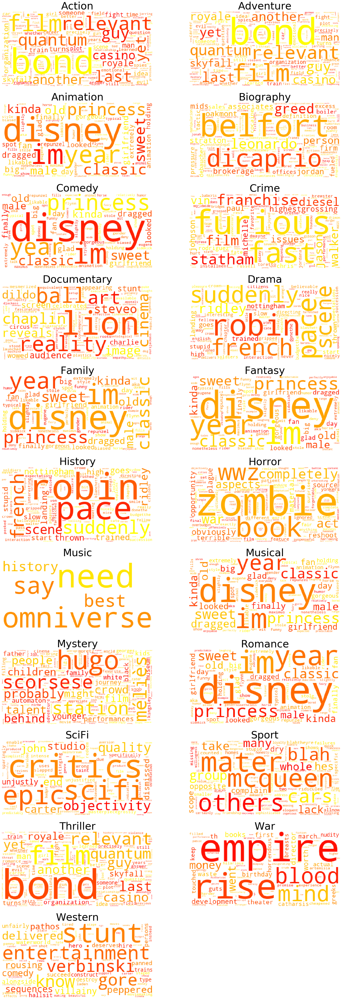

In [184]:
fig = plt.figure(figsize = (30, 170))
for i in range(len(genre_list)):
    ax = fig.add_subplot(len(genre_list),2,i+1)
    wordcloud = WordCloud(collocations = False, 
                       background_color = 'white', 
                       colormap = "autumn").generate(globals()['genre_{}_occur_pos'.format(genre_list[i])])
    plt.title(genre_list[i], fontsize = 50)
    ax.imshow(wordcloud)
    ax.axis('off')
plt.savefig('genre_positive.png')

The positive words in the wordclouds shows some patterns since they are more positive charged than the overall wordclouds. The wordclouds can be used to both identifying which movies are postively reviewed in each genre and how the watchers have felt when watching the movies in the given genre.  

The negative wordclouds are made below in the same way as above, but using reviews with a sentiment lower than the mean minus 2 times the standard deviation for the given genre. 

In [185]:
# For each genre, the negative reviews are found by using the above function
# The threshold is defined as mean - 2 * std
for genre in genre_list: 
    globals()['genre_{}_sentiment_neg'.format(genre)] = sentiment_rate_negative(globals()['genre_{}_movie_reviews'.format(genre)], 
                                                                           sentiment_dict, 
                                                                          np.mean(globals()['genre_{}_sentiment'.format(genre)] - 
                                                                                  (2*np.std(globals()['genre_{}_sentiment'.format(genre)]))))

In [186]:
# For each genre, the frequency of the negative words are found 
for genre in genre_list:
    globals()['genre_{}_tf_Freq_neg'.format(genre)] = nltk.FreqDist(globals()['genre_{}_sentiment_neg'.format(genre)][0])

In [187]:
# For the negative words in each genre, the TF, IDF and TF-IDF-scores are found
for genre in genre_list:
    globals()['genre_{}_tf_neg'.format(genre)] = tf_comp(globals()['genre_{}_tf_Freq_neg'.format(genre)])    

idf_all_genre_neg = idf_comp([genre_Action_tf_neg, genre_Adventure_tf_neg, genre_Animation_tf_neg, genre_Biography_tf_neg, 
                        genre_Comedy_tf_neg, genre_Crime_tf_neg, genre_Documentary_tf_neg, genre_Drama_tf_neg, 
                        genre_Family_tf_neg, genre_Fantasy_tf_neg, genre_History_tf_neg, genre_Horror_tf_neg, 
                        genre_Music_tf_neg, genre_Musical_tf_neg, genre_Mystery_tf_neg, genre_Romance_tf_neg,
                        genre_SciFi_tf_neg, genre_Sport_tf_neg, genre_Thriller_tf_neg, genre_War_tf_neg, genre_Western_tf_neg])

for genre in genre_list:
    globals()['genre_{}_tf_idf_neg'.format(genre)] = tf_idf_comp(globals()['genre_{}_tf_Freq_neg'.format(genre)], 
                                                                 idf_all_genre_neg) 

In [188]:
# The negative words in each genre are sorted
for genre in genre_list:
    globals()['genre_{}_x_neg'.format(genre)] = sorted(globals()['genre_{}_tf_idf_neg'.format(genre)].items(), 
                                                       key = lambda x: x[1], reverse = True)

In [189]:
# For each genre, the occurency-list is made for the negative words
for genre in genre_list:
    globals()['genre_{}_occur_neg'.format(genre)] = []
    for word in globals()['genre_{}_tf_idf_neg'.format(genre)]:
        globals()['genre_{}_r_neg'.format(genre)] = int(globals()['genre_{}_tf_idf_neg'.format(genre)][word])
        globals()['genre_{}_occur_neg'.format(genre)].append((word + ' ') * globals()['genre_{}_r_neg'.format(genre)])
    globals()['genre_{}_occur_neg'.format(genre)] = ' '.join(globals()['genre_{}_occur_neg'.format(genre)])

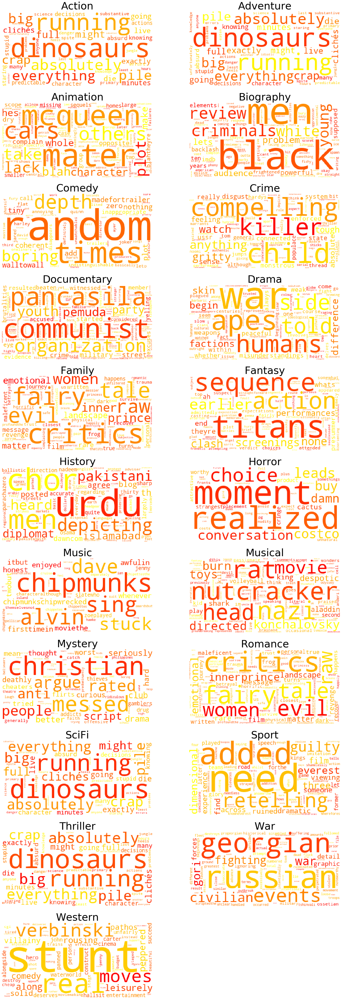

In [190]:
fig = plt.figure(figsize = (30, 170))
for i in range(len(genre_list)):
    ax = fig.add_subplot(len(genre_list),2,i+1)
    wordcloud = WordCloud(collocations = False, 
                       background_color = 'white', 
                       colormap = "autumn").generate(globals()['genre_{}_occur_neg'.format(genre_list[i])])
    plt.title(genre_list[i], fontsize = 50)
    ax.imshow(wordcloud)
    ax.axis('off')
plt.savefig('genre_negative.png')

Again, the wordclouds sounds a little more negative and shows some experience-connected words as well as the negatively reviewed movies.

From this positive/negative analysis it is now more clear what happens in the different genres and what makes a movie successful within the given genre. 

#### Text analysis outcomes

The text analysis have in the first part with the rank categories shown the connection between sentiments and IMDb-scores. The second part showed the reviews of the communities and gave an indication that genres might be important to look at. Lastly the analysis of reviews from different genres gave more insight regarding what makes a movie more succesful for the different genres. 

Unfortunately the reviews did not show as much information about the experience as it was wished for but more about the content of the movies. Therefore it has been difficult to makes clear conclusions in this analysis. 

## Part 4: Discussion

This part will discuss three main topics. 
* The overall results of the analyses 
* The data 
* Further work 

When looking at what went well and what did not the data is essential. The methods has been applied as expected and have been logic to use. However the data has resulted in outcomes being not as clear as wanted. 

To answer the question "What makes a movie successful?" this notebook has used many different methods and theories to enlighten the answer. This have shown that it is not only one parameter that is crucial to understand the success. The analysis have shown that both the actors, the budget and genres contribuate to the overall success. More parameters might have an influence as well but have not be investigated here. 

Further work includes both better use of the data and exploring other data sources. For IMDb it could be suggested that the ranking scale was used fully so that the lower ranked movies actually had a low IMDb-score. 

To sum up the use of the methods have been quite painless but the interpretation of the outcomes has been challenging since the outcomes have been more vague than expected. 

## Part 5: Contribution

Since this group has only two group members it has been easy to do all the analyses together, thus most of the work have only been done on one computer at a time. 
Because the interpretation of the outcomes have been so challenging it has been necessary for both memebers to discuss all of them toghether. 

A rough division of the responsibilities of the different section can be seen below: 
* Rebecca, s154100
    * Basic Stats
    * The structure of the network 
    * The review analyses of ranking and genre
* Laura, s152973
    * Preparation and visualization of the network 
    * Preparation of the text analysis
    * Community analyses